In [1]:
query = ''' 
with
    data_atual as(
    select 
      max(orderdate) as maior_data 
    from `adventureworks-dw-413814.sap_adw.salesorderheader`
),
    vendedor as (
        select
            salesperson.businessentityid as salesperson_id,
            salesperson.territoryid as territoryid_salesperson,
            person.businessentityid,
            person.persontype,
            concat(
                coalesce(person.title, ''),
                coalesce(person.firstname, ''),
                coalesce(person.middlename, ''),
                coalesce(person.lastname, ''),
                coalesce(person.suffix, '')
            ) as salesperson_fullname,
            customer.storeid

        from adventureworks-dw-413814.sap_adw.salesperson as salesperson
        left join
            adventureworks-dw-413814.sap_adw.customer as customer
            on salesperson.businessentityid = customer.customerid
        left join
            adventureworks-dw-413814.sap_adw.person as person
            on salesperson.businessentityid = person.businessentityid
    ),
    loja as (
        select
            store.businessentityid as storeid,
            store.name as name_store,
            store.salespersonid,
            businessentityaddress.addressid,
            address.city as city_store,
            address.stateprovinceid,
            stateprovince.countryregioncode,
            stateprovince.isonlystateprovinceflag,
            stateprovince.name as stateprovince_name,
            stateprovince.territoryid as territoryid_store
        from adventureworks-dw-413814.sap_adw.store as store
        left join
            adventureworks-dw-413814.sap_adw.businessentityaddress
            as businessentityaddress
            on store.businessentityid = businessentityaddress.businessentityid
        left join
            adventureworks-dw-413814.sap_adw.address as address
            on businessentityaddress.addressid = address.addressid
        left join
            adventureworks-dw-413814.sap_adw.stateprovince as stateprovince
            on address.stateprovinceid = stateprovince.stateprovinceid
    ),
    produto as (
        select
            product.productid,
            product.name as product_name,
            product.standardcost,
            product.listprice,
            product.daystomanufacture,
            case
                product.productline
                when 'R'
                then 'road'
                when 'M'
                then 'mountain'
                when 'T'
                then 'touring'
                when 'S'
                then 'standard'
                else 'undefined'
            end as product_line,
            case
                product.class
                when 'H'
                then 'high'
                when 'M'
                then 'medium'
                when 'L'
                then 'low'
                else 'undefined'
            end as product_class,
            case
                product.style
                when 'W'
                then 'womens'
                when 'M'
                then 'mens'
                when 'U'
                then 'universal'
                else 'undefined'
            end as product_style,
            product.productmodelid,
            productmodel.name as productmodel_name,
            product.sellenddate
        from adventureworks-dw-413814.sap_adw.product as product

        left join
            adventureworks-dw-413814.sap_adw.productmodel as productmodel
            on product.productmodelid = productmodel.productmodelid

    )

select
    cast(substr(salesorderheader.orderdate, 1, 10) as date) as orderdate,
    sum(salesorderdetail.orderqty) as total_qtd_product,
    max(salesorderdetail.unitprice) as unitprice_product,
    produto.productmodel_name,
    max(produto.standardcost) as standardcost_product,
    max(produto.listprice) as listprice_product,
    max(produto.daystomanufacture) as daystomanufature_product,
    produto.product_line,
    produto.product_class,
    produto.product_style,
    loja.name_store,
    loja.countryregioncode
    , produto.sellenddate

from adventureworks-dw-413814.sap_adw.salesorderheader as salesorderheader

left join
    adventureworks-dw-413814.sap_adw.salesorderdetail as salesorderdetail
    on salesorderheader.salesorderid = salesorderdetail.salesorderid

left join vendedor on salesorderheader.salespersonid = vendedor.salesperson_id

left join loja on vendedor.storeid = loja.storeid

left join produto on salesorderdetail.productid = produto.productid

inner join        -- descartando produtos com a data de encerramento de venda
    data_atual    -- anterior ao último registro. Não possuirão demanda.
on produto.sellenddate > data_atual.maior_data or produto.sellenddate is null

where salesorderheader.salesorderid = 69399
group by orderdate
         ,produto.productmodel_name
         ,produto.product_line
         ,produto.product_class
         ,produto.product_style
         ,loja.name_store
         ,loja.countryregioncode
         ,produto.sellenddate

order by orderdate, productmodel_name, loja.name_store
'''

In [2]:
import pandas as pd 

import numpy as np

import matplotlib.pyplot as plt #bibliotecas para visualizações
import seaborn as sns

from statsmodels.tsa.seasonal import seasonal_decompose

from datasetsforecast.hierarchical import HierarchicalData
from hierarchicalforecast.core import HierarchicalReconciliation
from hierarchicalforecast.methods import  BottomUp, TopDown, MiddleOut, MinTrace, ERM
from hierarchicalforecast.evaluation import HierarchicalEvaluation
from hierarchicalforecast.utils import aggregate

from statsforecast.core import StatsForecast
from statsforecast.utils import ConformalIntervals
from statsforecast.models import AutoARIMA, Naive, WindowAverage
import pyarrow

from datetime import datetime

from sklearn.metrics import mean_squared_error as mse

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline

C:\ProgramData\Anaconda3\lib\site-packages\statsforecast\core.py:26: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [3]:
pd.options.display.width = 0
pd.set_option('display.max_rows', 500)


In [4]:
# reading the dataset using read_csv
df = pd.read_csv("tabela_ds_agrupada.csv", 
                 parse_dates=True
                 #,index_col="orderdate"
                )
 
# displaying the first five rows of dataset
df.head()

,orderdate,total_qtd_product,unitprice_product,productmodel_name,standardcost_product,listprice_product,daystomanufature_product,product_line,product_class,product_style,name_store,countryregioncode
0,2011-05-31,3,5.1865,Cycling Cap,6.9223,8.99,0,undefined,undefined,undefined,Outdoor Sporting Goods,United States
1,2011-05-31,12,5.1865,Cycling Cap,6.9223,8.99,0,undefined,undefined,undefined,Petroleum Products Distributors,others
2,2011-05-31,8,5.1865,Cycling Cap,6.9223,8.99,0,undefined,undefined,undefined,Quick Parts and Service,others
3,2011-05-31,5,5.1865,Cycling Cap,6.9223,8.99,0,undefined,undefined,undefined,Racing Supply Distributors,others
4,2011-05-31,5,5.1865,Cycling Cap,6.9223,8.99,0,undefined,undefined,undefined,Reliable Brake Systems,United States


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22620 entries, 0 to 22619
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   orderdate                 22620 non-null  object 
 1   total_qtd_product         22620 non-null  int64  
 2   unitprice_product         22620 non-null  float64
 3   productmodel_name         22620 non-null  object 
 4   standardcost_product      22620 non-null  float64
 5   listprice_product         22620 non-null  float64
 6   daystomanufature_product  22620 non-null  int64  
 7   product_line              22620 non-null  object 
 8   product_class             22620 non-null  object 
 9   product_style             22620 non-null  object 
 10  name_store                9287 non-null   object 
 11  countryregioncode         22620 non-null  object 
dtypes: float64(3), int64(2), object(7)
memory usage: 2.1+ MB


In [6]:
# Convertendo a coluna 'orderdate' para datetime e substituindo pelos primeiros dias do mês correspondente
df['orderdate'] = pd.to_datetime(df['orderdate']).dt.to_period('M').dt.to_timestamp()
df['orderdate'].value_counts()

orderdate
2014-03-01    2189
2013-07-01    1813
2014-05-01    1744
2013-10-01    1740
2013-09-01    1602
2014-01-01    1517
2013-08-01    1516
2013-12-01    1491
2013-06-01    1398
2013-11-01    1390
2014-04-01    1023
2014-02-01     944
2013-05-01     691
2014-06-01     656
2012-06-01     253
2013-03-01     230
2012-07-01     226
2012-09-01     219
2013-04-01     218
2012-10-01     217
2013-02-01     206
2012-12-01     197
2012-08-01     188
2012-11-01     173
2013-01-01     169
2012-05-01     155
2011-10-01      88
2011-08-01      69
2012-01-01      68
2012-04-01      47
2012-03-01      46
2011-07-01      44
2012-02-01      37
2011-05-01      30
2011-12-01      26
Name: count, dtype: int64

In [7]:
df['name_store'] = df['name_store'].fillna('online')

## Período registrado das vendas

In [8]:
print('As datas encontram-se no intervalo de', df.orderdate.min(), 'até', df.orderdate.max())

As datas encontram-se no intervalo de 2011-05-01 00:00:00 até 2014-06-01 00:00:00


In [9]:
df = df[df['orderdate']>='2012-01-01']

Excluindo os primeiros 6 meses da série que trazem apenas 257 registros

In [10]:
print(df['orderdate'].min())
print(df['orderdate'].max())

2012-01-01 00:00:00
2014-06-01 00:00:00


In [11]:
# Agrupa por 'productmodel_name' e soma 'total_qtd_product'
df_total = df.groupby('productmodel_name')['total_qtd_product'].sum()

# Ordena o DataFrame pela soma
df_total = df_total.sort_values(ascending=False)

df_total


productmodel_name
Sport-100                      19400
Mountain-200                   14877
Long-Sleeve Logo Jersey        13437
Short-Sleeve Classic Jersey     9561
Cycling Cap                     8179
Women's Mountain Shorts         7907
Road-550-W                      7435
Half-Finger Gloves              7321
Classic Vest                    7159
Water Bottle                    7006
Touring-1000                    6588
Road-250                        6394
Touring-3000                    6002
Road-350-W                      4827
Road-750                        4606
Racing Socks                    4204
Mountain-500                    4100
Patch kit                       3906
HL Mountain Frame               3761
ML Road Frame-W                 3684
Bike Wash                       3466
LL Mountain Frame               3417
Hitch Rack - 4-Bike             3365
Mountain Tire Tube              3095
Hydration Pack                  2914
Touring-2000                    2795
LL Road Frame       

Considerando apenas os produtos com mais de 300 unidades vendidas nos últimos dois anos e meio

In [12]:
df.shape

(22363, 12)

In [13]:
# Cria uma nova coluna que é o produto de 'total_qtd_product' e 'unitprice_product'
df['total_value'] = df['total_qtd_product'] * df['unitprice_product']

# Agrupa por 'productmodel_name' e soma 'total_value'
df_total_value = df.groupby('productmodel_name')['total_value'].sum().round(2)

# Ordena o DataFrame pela soma
df_total_value = df_total_value.sort_values(ascending=False)

df_total_value

productmodel_name
Mountain-200                   22823249.82
Touring-1000                   10620078.22
Road-250                       10187146.42
Road-350-W                      5558495.12
Road-550-W                      5346698.16
HL Mountain Frame               2918663.53
Touring-3000                    2652193.85
Touring-2000                    2218073.13
Road-750                        1803998.59
Mountain-500                    1480389.58
HL Touring Frame                1416115.45
HL Road Frame                   1381453.87
ML Road Frame-W                 1248299.37
Mountain-400-W                  1020343.74
LL Mountain Frame                541355.31
LL Road Frame                    532593.93
Sport-100                        487173.89
Long-Sleeve Logo Jersey          430775.92
ML Mountain Frame-W              382949.86
Women's Mountain Shorts          360466.00
Short-Sleeve Classic Jersey      344186.25
LL Touring Frame                 308880.29
Classic Vest                     286

In [14]:
# ocorrências de vendas nos últimos 12 meses
df['productmodel_name'][df['orderdate'] > '2013-05-31'].value_counts()


productmodel_name
Cycling Cap                    546
Water Bottle                   543
Sport-100                      543
Short-Sleeve Classic Jersey    543
Long-Sleeve Logo Jersey        531
Mountain-200                   512
Half-Finger Gloves             508
Women's Mountain Shorts        500
Bike Wash                      493
Touring-1000                   493
Road-750                       485
Patch kit                      475
Road-550-W                     458
Hydration Pack                 456
Classic Vest                   444
Road-350-W                     439
Touring-3000                   426
Road-250                       421
Racing Socks                   407
Fender Set - Mountain          388
Road Tire Tube                 387
Mountain Bottle Cage           385
Mountain Tire Tube             381
Mountain-500                   379
Mountain-400-W                 373
HL Mountain Tire               373
Touring-2000                   370
Hitch Rack - 4-Bike            367
To

In [15]:
to_remove = ['LL Crankset '
             ,'HL Road Frame'
             ,'HL Mountain Handlebars'
             ,'Rear Brakes'
             ,'Rear Derailleur'
             ,'All-Purpose Bike Stand'
             ,'HL Touring Handlebars'
             ,'LL Road Handlebars'
             ,'HL Road Handlebars'
             ,'Touring Pedal'
             ,'HL Road Seat/Saddle 2'
             ,'LL Touring Seat/Saddle'
             ,'ML Touring Seat/Saddle'
             ,'ML Mountain Seat/Saddle 2'
             ,'ML Crankset'
             ,'LL Crankset'
             ,'LL Touring Handlebars'
             ,'LL Road Seat/Saddle 1'
             ,'LL Mountain Seat/Saddle 2'
             ,'LL Mountain Pedal'
             ,'ML Mountain Pedal'
             ,'LL Bottom Bracket'
             ,'LL Mountain Handlebars'
            ] 

# Em seguida, remova essas linhas do DataFrame
df = df[~df['productmodel_name'].isin(to_remove)]

In [16]:
df.shape

(20516, 13)

In [17]:
df['productmodel_name'].value_counts()

productmodel_name
Mountain-200                   987
Road-250                       856
Road-550-W                     810
Cycling Cap                    741
Long-Sleeve Logo Jersey        729
Sport-100                      724
Half-Finger Gloves             641
Short-Sleeve Classic Jersey    557
Water Bottle                   556
Women's Mountain Shorts        511
Touring-1000                   505
Bike Wash                      504
Road-750                       499
Patch kit                      486
Hydration Pack                 467
Classic Vest                   455
Road-350-W                     453
Touring-3000                   436
Racing Socks                   419
Road Tire Tube                 389
Fender Set - Mountain          389
Mountain-500                   388
Mountain Bottle Cage           387
Mountain-400-W                 383
Mountain Tire Tube             383
Touring-2000                   381
Hitch Rack - 4-Bike            378
HL Mountain Tire               374
To

In [18]:
df['name_store'][df['countryregioncode']=='United States'].value_counts()

name_store
The Bicycle Accessories Company    636
Thrifty Parts and Sales            612
Moderately-Priced Bikes Store      600
Outdoor Sporting Goods             581
Reliable Brake Systems             576
Friendly Bike Shop                 519
Tread Industries                   455
Kickstand Sellers                  394
Active Systems                     214
Handy Bike Services                147
Name: count, dtype: int64

In [19]:
df['countryregioncode'] = df['countryregioncode'].str.replace("United States", "US")

In [20]:
df['name_store'][df['countryregioncode']=='others'].value_counts()

name_store
online                             13142
Quick Parts and Service              574
Petroleum Products Distributors      564
Racing Supply Distributors           459
Nearby Bike Mall                     401
Standard Bikes                       338
Number One Bike Co.                  241
Nearest Bike Store                    63
Name: count, dtype: int64

In [21]:
# Agrupa por 'productmodel_name' e soma 'total_qtd_product'
df_total = df.groupby('name_store')['total_qtd_product'].sum()

# Ordena o DataFrame pela soma
df_total = df_total.sort_values(ascending=False)

df_total


name_store
online                             56911
Moderately-Priced Bikes Store      17999
Thrifty Parts and Sales            17317
The Bicycle Accessories Company    16283
Tread Industries                   15014
Outdoor Sporting Goods             13666
Friendly Bike Shop                 10943
Quick Parts and Service             9761
Reliable Brake Systems              9569
Petroleum Products Distributors     9431
Kickstand Sellers                   6673
Racing Supply Distributors          5094
Standard Bikes                      4370
Nearby Bike Mall                    4365
Number One Bike Co.                 3937
Active Systems                      2122
Handy Bike Services                 1592
Nearest Bike Store                   789
Name: total_qtd_product, dtype: int64

In [22]:
# Cria uma nova coluna que é o produto de 'total_qtd_product' e 'unitprice_product'
df['total_value'] = df['total_qtd_product'] * df['unitprice_product']

# Agrupa por 'productmodel_name' e soma 'total_value'
df_total_value = df.groupby('name_store')['total_value'].sum().round(2)

# Ordena o DataFrame pela soma
df_total_value = df_total_value.sort_values(ascending=False)

df_total_value

name_store
online                             20752279.67
Moderately-Priced Bikes Store       6597314.62
Thrifty Parts and Sales             6533115.19
Outdoor Sporting Goods              5814348.30
The Bicycle Accessories Company     5234004.83
Tread Industries                    4018574.97
Friendly Bike Shop                  3819113.74
Petroleum Products Distributors     3706304.87
Reliable Brake Systems              3572070.27
Quick Parts and Service             3352399.27
Racing Supply Distributors          2286003.23
Nearby Bike Mall                    1978225.89
Standard Bikes                      1855773.71
Kickstand Sellers                   1837731.56
Number One Bike Co.                 1477411.52
Active Systems                       735706.30
Handy Bike Services                  663806.86
Nearest Bike Store                   184924.53
Name: total_value, dtype: float64

In [23]:
df.shape

(20516, 13)

Abaixo de 2M em receita e abaixo de 5k itens não serão considerados

In [24]:
to_remove = ['Nearby Bike Mall','Standard Bikes','Number One Bike Co.','Active Systems', 'Handy Bike Services','Nearest Bike Store']

# Em seguida, remova essas linhas do DataFrame
df = df[~df['name_store'].isin(to_remove)]

In [25]:
df.shape

(19112, 13)

In [26]:
df['name_store'].unique()

array(['Outdoor Sporting Goods', 'Petroleum Products Distributors',
       'Quick Parts and Service', 'Racing Supply Distributors',
       'Reliable Brake Systems', 'The Bicycle Accessories Company',
       'Thrifty Parts and Sales', 'Tread Industries',
       'Friendly Bike Shop', 'Moderately-Priced Bikes Store', 'online',
       'Kickstand Sellers'], dtype=object)

In [27]:
df['name_store'] = df['name_store'].str.replace(" ", "_")

In [28]:
df['name_store'].unique()

array(['Outdoor_Sporting_Goods', 'Petroleum_Products_Distributors',
       'Quick_Parts_and_Service', 'Racing_Supply_Distributors',
       'Reliable_Brake_Systems', 'The_Bicycle_Accessories_Company',
       'Thrifty_Parts_and_Sales', 'Tread_Industries',
       'Friendly_Bike_Shop', 'Moderately-Priced_Bikes_Store', 'online',
       'Kickstand_Sellers'], dtype=object)

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19112 entries, 258 to 22619
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   orderdate                 19112 non-null  datetime64[ns]
 1   total_qtd_product         19112 non-null  int64         
 2   unitprice_product         19112 non-null  float64       
 3   productmodel_name         19112 non-null  object        
 4   standardcost_product      19112 non-null  float64       
 5   listprice_product         19112 non-null  float64       
 6   daystomanufature_product  19112 non-null  int64         
 7   product_line              19112 non-null  object        
 8   product_class             19112 non-null  object        
 9   product_style             19112 non-null  object        
 10  name_store                19112 non-null  object        
 11  countryregioncode         19112 non-null  object        
 12  total_value          

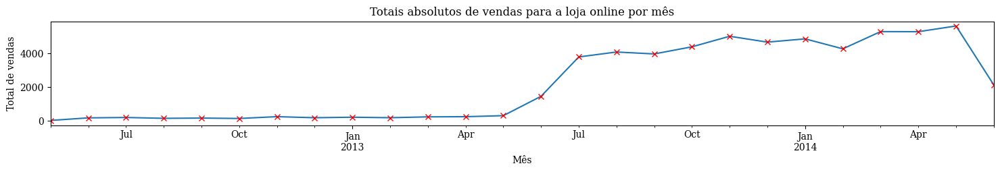

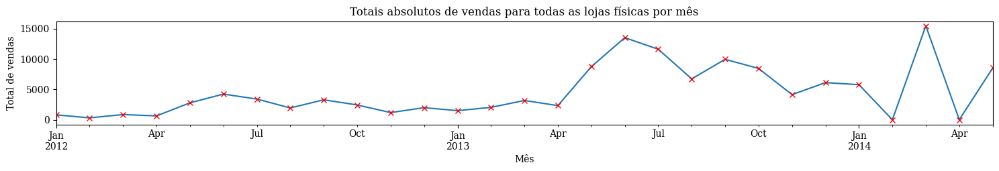

In [30]:
#copia o df original
df_aux = df.copy()

df_aux['orderdate'] = pd.to_datetime(df_aux['orderdate'])
df_aux.set_index('orderdate', inplace=True)
# Crie uma nova coluna 'ano-mês' no DataFrame
df_aux['ano_mes'] = df_aux.index.to_period('M')

# Filtra os dados para a loja 'online'
df_online = df_aux[df_aux['name_store'] == 'online']

# Filtra os dados para todas as outras lojas
df_outros = df_aux[df_aux['name_store'] != 'online']

# Agrupa os dados por 'ano-mês' e soma as vendas
df_total_online = df_online.groupby('ano_mes')['total_qtd_product'].sum()
df_total_outros = df_outros.groupby('ano_mes')['total_qtd_product'].sum()

# Cria o gráfico para a loja 'online'
df_total_online.plot(kind='line', figsize=(18,2))
df_total_online.plot(marker='x', linestyle='', color='red')
plt.title('Totais absolutos de vendas para a loja online por mês')
plt.xlabel('Mês')
plt.ylabel('Total de vendas')
plt.show()

# Cria o gráfico para todas as outras lojas
df_total_outros.plot(kind='line', figsize=(18,2))
df_total_outros.plot(marker='x', linestyle='', color='red')
plt.title('Totais absolutos de vendas para todas as lojas físicas por mês')
plt.xlabel('Mês')
plt.ylabel('Total de vendas')
plt.show()


In [31]:
print("Hierarquia das lojas")
for store in np.sort(df['name_store'].unique()):
    print("├──>",store)


Hierarquia das lojas
├──> Friendly_Bike_Shop
├──> Kickstand_Sellers
├──> Moderately-Priced_Bikes_Store
├──> Outdoor_Sporting_Goods
├──> Petroleum_Products_Distributors
├──> Quick_Parts_and_Service
├──> Racing_Supply_Distributors
├──> Reliable_Brake_Systems
├──> The_Bicycle_Accessories_Company
├──> Thrifty_Parts_and_Sales
├──> Tread_Industries
├──> online


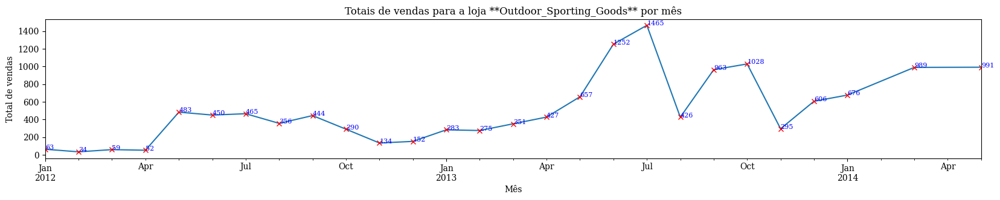

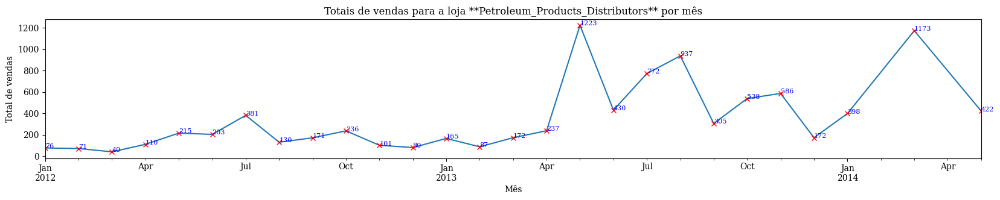

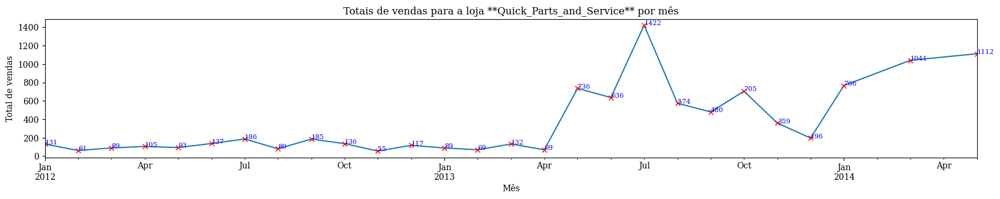

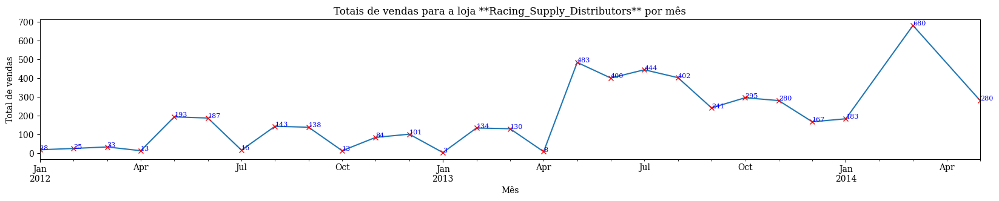

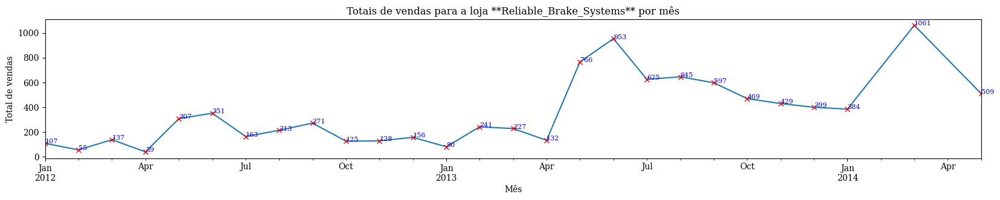

...

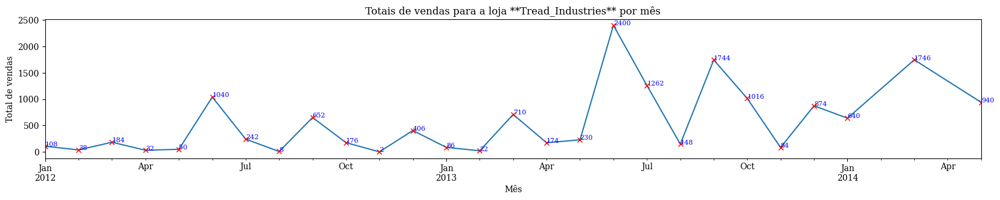

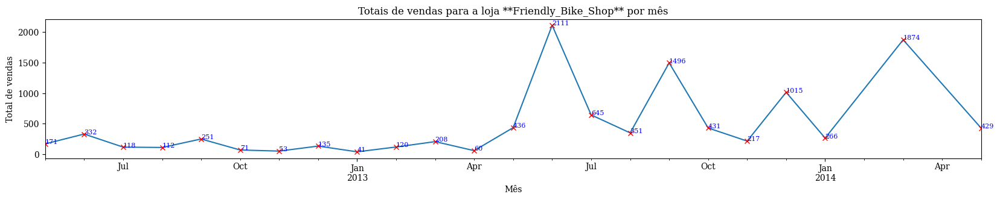

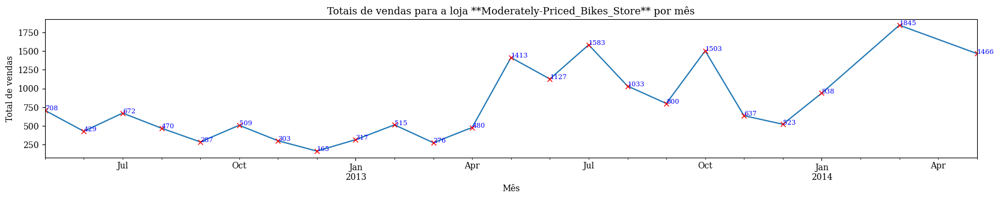

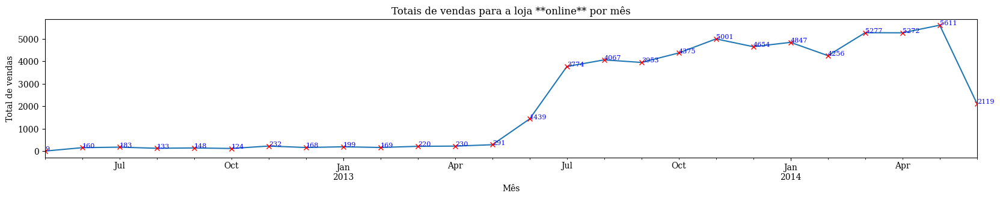

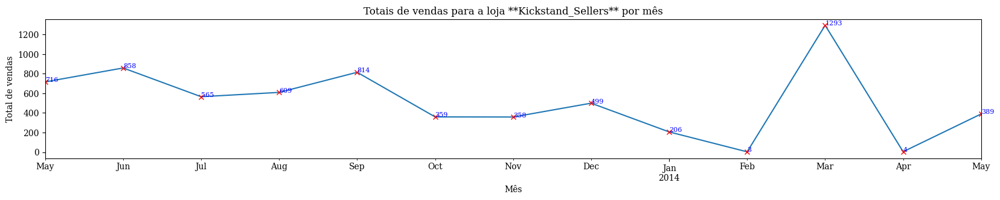

In [32]:
# Obtenha a lista de todas as lojas únicas
lojas = df_aux['name_store'].unique()

# Para cada loja, crie um gráfico separado
for loja in lojas:
    # Filtra os dados para a loja atual
    df_loja = df_aux[df_aux['name_store'] == loja]
    
    # Agrupa os dados por 'ano-mês' e soma as vendas
    df_grouped = df_loja.groupby('ano_mes')['total_qtd_product'].sum()
    
    # Cria o gráfico
    df_grouped.plot(kind='line', figsize=(20,3))

    # Adiciona marcações com 'x' vermelho nos pontos de dados
    df_grouped.plot(marker='x', linestyle='', color='red')
    
    # Adiciona os valores para cada ponto
    for x, y in zip(df_grouped.index, df_grouped.values):
        plt.text(x, y, str(y), color="blue", fontsize=8)
    
    plt.title(f'Totais de vendas para a loja **{loja}** por mês')
    plt.xlabel('Mês')
    plt.ylabel('Total de vendas')
    plt.show()

In [33]:
print("Hierarquia das lojas e seus produtos")
for store in np.sort(df['name_store'].unique()):
    print("├──>",store)
    for produto in  np.sort(df['productmodel_name'][df['name_store']==store].unique()):
        print("│  ├───>", produto)        
    

Hierarquia das lojas e seus produtos
├──> Friendly_Bike_Shop
│  ├───> Bike Wash
│  ├───> Chain
│  ├───> Classic Vest
│  ├───> Cycling Cap
│  ├───> Front Brakes
│  ├───> Front Derailleur
│  ├───> HL Bottom Bracket
│  ├───> HL Crankset
│  ├───> HL Mountain Frame
│  ├───> HL Mountain Pedal
│  ├───> HL Mountain Seat/Saddle 2
│  ├───> HL Road Pedal
│  ├───> HL Touring Frame
│  ├───> HL Touring Seat/Saddle
│  ├───> Half-Finger Gloves
│  ├───> Hitch Rack - 4-Bike
│  ├───> Hydration Pack
│  ├───> LL Mountain Frame
│  ├───> LL Road Frame
│  ├───> LL Road Pedal
│  ├───> LL Touring Frame
│  ├───> Long-Sleeve Logo Jersey
│  ├───> ML Mountain Frame-W
│  ├───> ML Mountain Handlebars
│  ├───> ML Road Frame-W
│  ├───> ML Road Pedal
│  ├───> Mountain-200
│  ├───> Mountain-400-W
│  ├───> Mountain-500
│  ├───> Patch kit
│  ├───> Racing Socks
│  ├───> Road-250
│  ├───> Road-350-W
│  ├───> Road-550-W
│  ├───> Road-750
│  ├───> Short-Sleeve Classic Jersey
│  ├───> Sport-100
│  ├───> Touring-1000
│  ├───> To

In [34]:
df['productmodel_name'].unique()

array(['Cycling Cap', 'HL Mountain Frame', 'LL Road Frame',
       'Long-Sleeve Logo Jersey', 'Sport-100', 'Half-Finger Gloves',
       'ML Mountain Handlebars', 'ML Road Frame-W', 'Mountain-200',
       'Road-250', 'Road-550-W', 'Bike Wash', 'Chain', 'Classic Vest',
       'Front Brakes', 'Front Derailleur', 'HL Bottom Bracket',
       'HL Crankset', 'HL Mountain Pedal', 'HL Mountain Seat/Saddle 2',
       'HL Mountain Tire', 'HL Road Pedal', 'HL Road Tire',
       'HL Touring Frame', 'HL Touring Seat/Saddle',
       'Hitch Rack - 4-Bike', 'Hydration Pack', 'LL Mountain Frame',
       'LL Road Pedal', 'LL Road Tire', 'LL Touring Frame',
       'ML Mountain Frame-W', 'ML Road Pedal', 'Mountain Bottle Cage',
       'Mountain Tire Tube', 'Mountain-400-W', 'Mountain-500',
       'Patch kit', 'Racing Socks', 'Road Bottle Cage', 'Road Tire Tube',
       'Road-350-W', 'Road-750', 'Short-Sleeve Classic Jersey',
       'Touring Tire', 'Touring Tire Tube', 'Touring-1000',
       'Touring-2000',

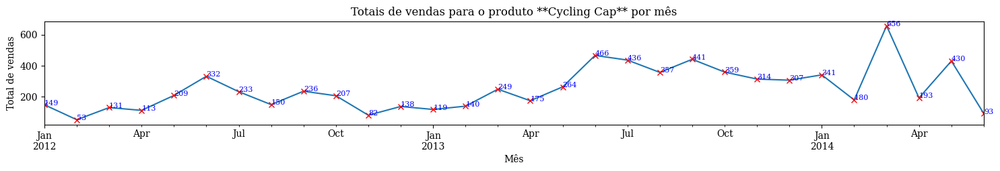

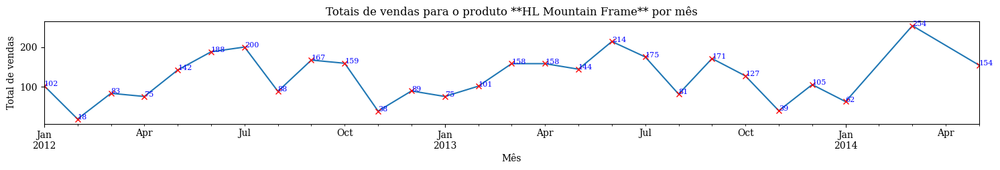

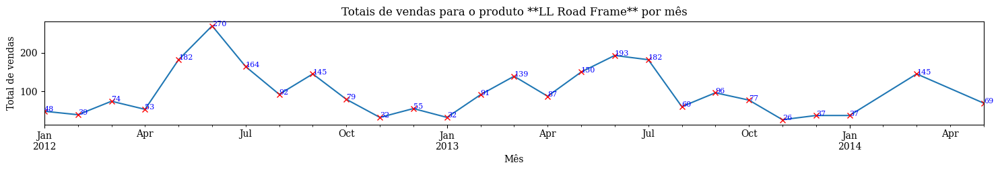

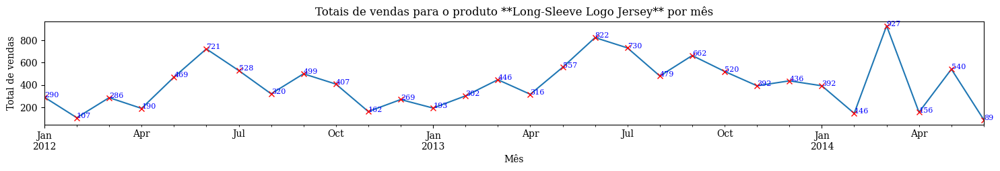

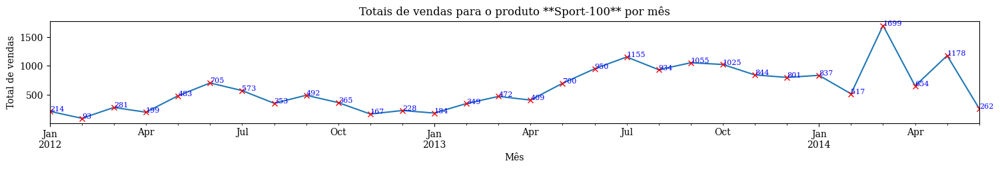

...

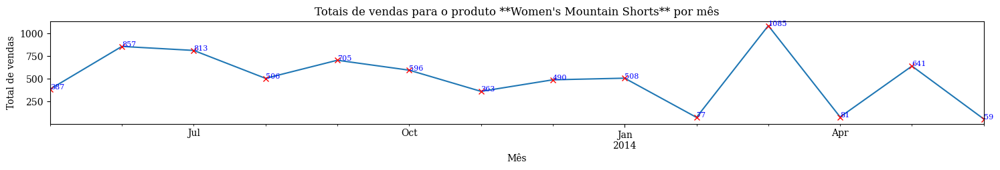

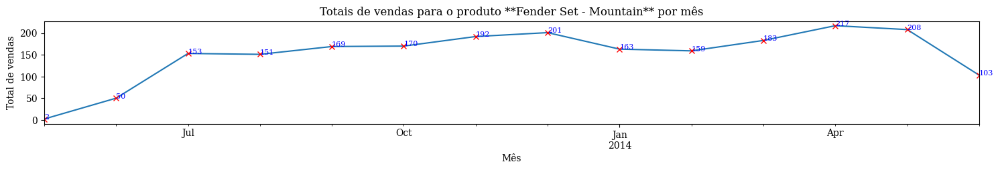

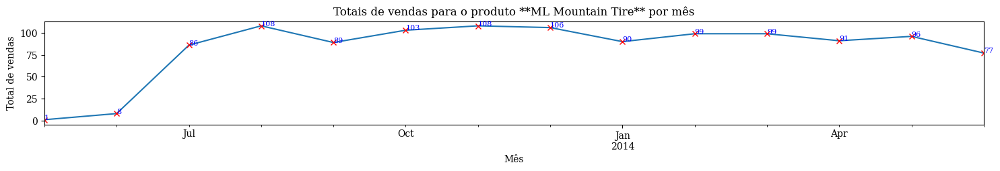

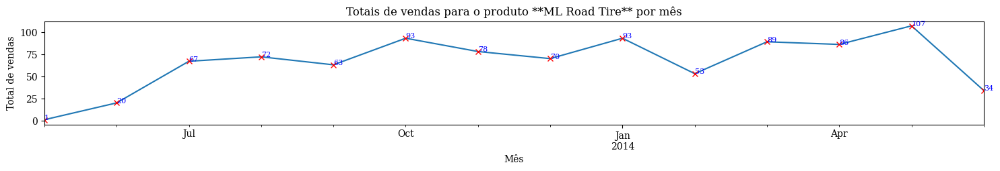

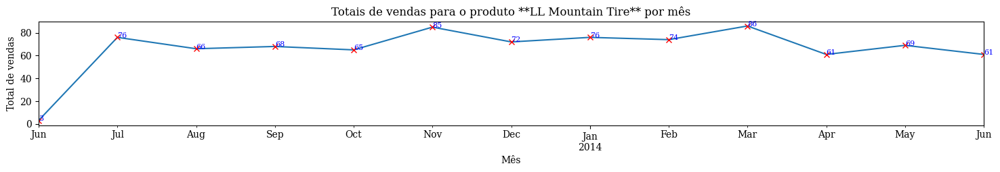

In [35]:
produtos  = df['productmodel_name'].unique()
# Para cada modelo de produto, cria um gráfico separado
for produto in produtos:
    # Filtra os dados para o modelo de produto atual
    df_produto = df_aux[df_aux['productmodel_name'] == produto]
    
    # Agrupa os dados por 'ano-mês' e soma as vendas
    df_grouped = df_produto.groupby('ano_mes')['total_qtd_product'].sum()
    
    # Cria o gráfico
    df_grouped.plot(kind='line', figsize=(18, 2))

    # Adiciona marcações com 'x' vermelho nos pontos de dados
    df_grouped.plot(marker='x', linestyle='', color='red')
    
    # Adiciona os valores para cada ponto
    for x, y in zip(df_grouped.index, df_grouped.values):
        plt.text(x, y, str(y), color="blue", fontsize=8)
    
    plt.title(f'Totais de vendas para o produto **{produto}** por mês')
    plt.xlabel('Mês')
    plt.ylabel('Total de vendas')
    plt.show()

### Limpeza dos nomes de produtos para remoção de caracteres problemáticos

In [36]:
df['productmodel_name'] = df['productmodel_name'].str.replace("'", "")

In [37]:
df['productmodel_name'] = df['productmodel_name'].str.replace(" ", "_")

In [38]:
df['productmodel_name'] = df['productmodel_name'].str.replace("/", "--")

In [39]:
df['productmodel_name'].unique()

array(['Cycling_Cap', 'HL_Mountain_Frame', 'LL_Road_Frame',
       'Long-Sleeve_Logo_Jersey', 'Sport-100', 'Half-Finger_Gloves',
       'ML_Mountain_Handlebars', 'ML_Road_Frame-W', 'Mountain-200',
       'Road-250', 'Road-550-W', 'Bike_Wash', 'Chain', 'Classic_Vest',
       'Front_Brakes', 'Front_Derailleur', 'HL_Bottom_Bracket',
       'HL_Crankset', 'HL_Mountain_Pedal', 'HL_Mountain_Seat--Saddle_2',
       'HL_Mountain_Tire', 'HL_Road_Pedal', 'HL_Road_Tire',
       'HL_Touring_Frame', 'HL_Touring_Seat--Saddle',
       'Hitch_Rack_-_4-Bike', 'Hydration_Pack', 'LL_Mountain_Frame',
       'LL_Road_Pedal', 'LL_Road_Tire', 'LL_Touring_Frame',
       'ML_Mountain_Frame-W', 'ML_Road_Pedal', 'Mountain_Bottle_Cage',
       'Mountain_Tire_Tube', 'Mountain-400-W', 'Mountain-500',
       'Patch_kit', 'Racing_Socks', 'Road_Bottle_Cage', 'Road_Tire_Tube',
       'Road-350-W', 'Road-750', 'Short-Sleeve_Classic_Jersey',
       'Touring_Tire', 'Touring_Tire_Tube', 'Touring-1000',
       'Touring-2000

In [40]:
print(df.columns)

Index(['orderdate', 'total_qtd_product', 'unitprice_product',
       'productmodel_name', 'standardcost_product', 'listprice_product',
       'daystomanufature_product', 'product_line', 'product_class',
       'product_style', 'name_store', 'countryregioncode', 'total_value'],
      dtype='object')


In [41]:
df['orderdate'].max()

Timestamp('2014-06-01 00:00:00')

In [42]:
Y_df = df.copy()
Y_df.head()

,orderdate,total_qtd_product,unitprice_product,productmodel_name,standardcost_product,listprice_product,daystomanufature_product,product_line,product_class,product_style,name_store,countryregioncode,total_value
258,2012-01-01,8,5.1865,Cycling_Cap,6.9223,8.99,0,undefined,undefined,undefined,Outdoor_Sporting_Goods,US,41.4920
259,2012-01-01,1,5.1865,Cycling_Cap,6.9223,8.99,0,undefined,undefined,undefined,Petroleum_Products_Distributors,others,5.1865
260,2012-01-01,14,5.1865,Cycling_Cap,6.9223,8.99,0,undefined,undefined,undefined,Quick_Parts_and_Service,others,72.6110
261,2012-01-01,5,5.1865,Cycling_Cap,6.9223,8.99,0,undefined,undefined,undefined,Racing_Supply_Distributors,others,25.9325
262,2012-01-01,15,5.1865,Cycling_Cap,6.9223,8.99,0,undefined,undefined,undefined,Reliable_Brake_Systems,US,77.7975


In [43]:
df['countryregioncode'] = df['countryregioncode'].str.replace("United States", "US")

In [44]:
# Convertendo o nome das colunas para o nome que a biblioteca espera
Y_df = Y_df.rename({'total_qtd_product': 'y', 'orderdate': 'ds','productmodel_name':'product','name_store':'store','countryregioncode':'region'}, axis=1)
# Adicionando o nível de hierarquia maior, o país
Y_df.insert(0, 'Total', 'Total')


In [45]:
Y_df.reset_index(drop=True, inplace=True)

In [46]:
Y_df.head()

,Total,ds,y,unitprice_product,product,standardcost_product,listprice_product,daystomanufature_product,product_line,product_class,product_style,store,region,total_value
0,Total,2012-01-01,8,5.1865,Cycling_Cap,6.9223,8.99,0,undefined,undefined,undefined,Outdoor_Sporting_Goods,US,41.4920
1,Total,2012-01-01,1,5.1865,Cycling_Cap,6.9223,8.99,0,undefined,undefined,undefined,Petroleum_Products_Distributors,others,5.1865
2,Total,2012-01-01,14,5.1865,Cycling_Cap,6.9223,8.99,0,undefined,undefined,undefined,Quick_Parts_and_Service,others,72.6110
3,Total,2012-01-01,5,5.1865,Cycling_Cap,6.9223,8.99,0,undefined,undefined,undefined,Racing_Supply_Distributors,others,25.9325
4,Total,2012-01-01,15,5.1865,Cycling_Cap,6.9223,8.99,0,undefined,undefined,undefined,Reliable_Brake_Systems,US,77.7975


In [47]:
print(Y_df.columns)

Index(['Total', 'ds', 'y', 'unitprice_product', 'product',
       'standardcost_product', 'listprice_product', 'daystomanufature_product',
       'product_line', 'product_class', 'product_style', 'store', 'region',
       'total_value'],
      dtype='object')


In [48]:
# create unique identifiers per level in the hierarchy
Y_df['region']  = Y_df['Total'] + '>' + Y_df['region']
Y_df['store']   = Y_df['region'] + '>' + Y_df['store']
Y_df['product'] = Y_df['store'] + '>' + Y_df['product']

Y_df.head(3)

,Total,ds,y,unitprice_product,product,standardcost_product,listprice_product,daystomanufature_product,product_line,product_class,product_style,store,region,total_value
0,Total,2012-01-01,8,5.1865,Total>US>Outdoor_Sporting_Goods>Cycling_Cap,6.9223,8.99,0,undefined,undefined,undefined,Total>US>Outdoor_Sporting_Goods,Total>US,41.4920
1,Total,2012-01-01,1,5.1865,Total>others>Petroleum_Products_Distributors>C...,6.9223,8.99,0,undefined,undefined,undefined,Total>others>Petroleum_Products_Distributors,Total>others,5.1865
2,Total,2012-01-01,14,5.1865,Total>others>Quick_Parts_and_Service>Cycling_Cap,6.9223,8.99,0,undefined,undefined,undefined,Total>others>Quick_Parts_and_Service,Total>others,72.6110


In [49]:
# Convertendo a coluna 'ds' para datetime e extraindo o mês
Y_df['ds'] = pd.to_datetime(Y_df['ds'])
Y_df['month_year'] = Y_df['ds'].dt.to_period('M')

# Criando um DataFrame com todas as combinações possíveis de meses e produtos
all_dates = pd.period_range(start='2012-01', end='2014-06', freq='M')
all_products = Y_df['product'].unique()
index = pd.MultiIndex.from_product([all_dates, all_products], names=['month_year', 'product'])

all_combinations_df = pd.DataFrame(index=index).reset_index()

# Agrupando os dados por mês e produto
df_prod = Y_df.groupby(['month_year', 'product'])[['y']].sum().reset_index()

# Mesclando com todas as combinações possíveis
df_prod = all_combinations_df.merge(df_prod, how='left', on=['month_year', 'product']).fillna(0)

# Renomeando as colunas
df_prod.columns = ['ds', 'unique_id', 'sales']


In [50]:
# Criando um DataFrame com todas as combinações possíveis de meses e lojas
all_stores = Y_df['store'].unique()
index = pd.MultiIndex.from_product([all_dates, all_stores], names=['month_year', 'store'])

all_combinations_df = pd.DataFrame(index=index).reset_index()

# Agrupando os dados por mês e loja
df_store = Y_df.groupby(['month_year', 'store'])[['y']].sum().reset_index()

# Mesclando com todas as combinações possíveis
df_store = all_combinations_df.merge(df_store, how='left', on=['month_year', 'store']).fillna(0)

# Renomeando as colunas
df_store.columns = ['ds', 'unique_id', 'sales']


In [51]:
# Criando um DataFrame com todas as combinações possíveis de meses e regiões
all_regions = Y_df['region'].unique()
index = pd.MultiIndex.from_product([all_dates, all_regions], names=['month_year', 'region'])

all_combinations_df = pd.DataFrame(index=index).reset_index()

# Agrupando os dados por mês e região
df_reg = Y_df.groupby(['month_year', 'region'])[['y']].sum().reset_index()

# Mesclando com todas as combinações possíveis
df_reg = all_combinations_df.merge(df_reg, how='left', on=['month_year', 'region']).fillna(0)

# Renomeando as colunas
df_reg.columns = ['ds', 'unique_id', 'sales']


In [52]:
df_reg.dtypes

ds           period[M]
unique_id       object
sales          float64
dtype: object

In [53]:
# Criando um DataFrame com todos os meses
all_dates_df = pd.DataFrame(all_dates.to_timestamp(), columns=['ds'])

# Adicionando uma coluna 'unique_id' com o valor 'Total'
all_dates_df['unique_id'] = 'Total'

# Agrupando os dados por mês
df_tot = Y_df.groupby(['month_year'])[['y']].sum().reset_index()

# Convertendo 'month_year' para datetime para mesclar com 'all_dates_df'
df_tot['month_year'] = df_tot['month_year'].dt.to_timestamp()

# Mesclando com todas as datas possíveis
df_tot = all_dates_df.merge(df_tot, how='left', left_on='ds', right_on='month_year').fillna(0)

# Deletando a coluna 'month_year'
df_tot = df_tot.drop(columns=['month_year'])

df_tot['ds'] = df_tot['ds'].dt.to_period('M')


# Renomeando as colunas
df_tot.columns = ['ds', 'unique_id', 'sales']


In [54]:
df_tot.tail()

,ds,unique_id,sales
25,2014-02,Total,4259
26,2014-03,Total,20727
27,2014-04,Total,5276
28,2014-05,Total,14120
29,2014-06,Total,2119


In [55]:
df_tot.dtypes

ds           period[M]
unique_id       object
sales            int64
dtype: object

In [56]:
# combine all four
dfx = pd.concat([df_prod, df_store, df_reg, df_tot], axis = 0)
print(df_prod.shape, df_store.shape, df_reg.shape, df_tot.shape, dfx.shape)



(14940, 3) (360, 3) (60, 3) (30, 3) (15390, 3)


In [57]:
dfx.head()

,ds,unique_id,sales
0,2012-01,Total>US>Outdoor_Sporting_Goods>Cycling_Cap,9.0
1,2012-01,Total>others>Petroleum_Products_Distributors>C...,16.0
2,2012-01,Total>others>Quick_Parts_and_Service>Cycling_Cap,26.0
3,2012-01,Total>others>Racing_Supply_Distributors>Cyclin...,5.0
4,2012-01,Total>US>Reliable_Brake_Systems>Cycling_Cap,19.0


In [58]:
dfx.tail()

,ds,unique_id,sales
25,2014-02,Total,4259.0
26,2014-03,Total,20727.0
27,2014-04,Total,5276.0
28,2014-05,Total,14120.0
29,2014-06,Total,2119.0


In [59]:
dfx.dtypes

ds           period[M]
unique_id       object
sales          float64
dtype: object

In [60]:
dfx.columns = ['ds','unique_id', 'y']

dfx['y'] = dfx['y'].astype(int)
dfx['ds'] = dfx['ds'].dt.to_timestamp()

# format
xset = set(dfx.unique_id)

In [61]:
dfx.head()

,ds,unique_id,y
0,2012-01-01,Total>US>Outdoor_Sporting_Goods>Cycling_Cap,9
1,2012-01-01,Total>others>Petroleum_Products_Distributors>C...,16
2,2012-01-01,Total>others>Quick_Parts_and_Service>Cycling_Cap,26
3,2012-01-01,Total>others>Racing_Supply_Distributors>Cyclin...,5
4,2012-01-01,Total>US>Reliable_Brake_Systems>Cycling_Cap,19


In [62]:
dfx.tail()


,ds,unique_id,y
25,2014-02-01,Total,4259
26,2014-03-01,Total,20727
27,2014-04-01,Total,5276
28,2014-05-01,Total,14120
29,2014-06-01,Total,2119


In [63]:
# drop rows with insufficient amount of observations - the prediction methods in StatsForecast do not allow NA :-(
#dfx['cnt'] = dfx.groupby('y')['unique_id'].transform('count')
#print(dfx.shape)
#sufficient_ammount_observations = 
#dfx = dfx.loc[dfx['cnt']==sufficient_ammount_observations]
print(dfx.shape)

(15390, 3)


In [64]:
dfx['ds'].value_counts()

ds
2012-01-01    513
2012-02-01    513
2014-05-01    513
2014-04-01    513
2014-03-01    513
2014-02-01    513
2014-01-01    513
2013-12-01    513
2013-11-01    513
2013-10-01    513
2013-09-01    513
2013-08-01    513
2013-07-01    513
2013-06-01    513
2013-05-01    513
2013-04-01    513
2013-03-01    513
2013-02-01    513
2013-01-01    513
2012-12-01    513
2012-11-01    513
2012-10-01    513
2012-09-01    513
2012-08-01    513
2012-07-01    513
2012-06-01    513
2012-05-01    513
2012-04-01    513
2012-03-01    513
2014-06-01    513
Name: count, dtype: int64

In [65]:
#dfx['y'].unique()

In [66]:
xset = set(dfx.unique_id)
list1 = list(xset)
list1.sort()

list2 = [f for f in list1 if f.count('>') == 3]
list2.sort()

S = np.zeros((len(list1), len(list2)))
S = pd.DataFrame(S); S.index = list1; S.columns = list2

# populate the summing matrix
S.loc['Total'] = 1
for xcol in list1[:-1]:
    fl = [f for f in list2 if xcol in f]
    S.loc[xcol][fl] = 1

In [67]:
S.head()

,Total>US>Friendly_Bike_Shop>Bike_Wash,Total>US>Friendly_Bike_Shop>Chain,Total>US>Friendly_Bike_Shop>Classic_Vest,Total>US>Friendly_Bike_Shop>Cycling_Cap,Total>US>Friendly_Bike_Shop>Front_Brakes,Total>US>Friendly_Bike_Shop>Front_Derailleur,Total>US>Friendly_Bike_Shop>HL_Bottom_Bracket,Total>US>Friendly_Bike_Shop>HL_Crankset,Total>US>Friendly_Bike_Shop>HL_Mountain_Frame,Total>US>Friendly_Bike_Shop>HL_Mountain_Pedal,...,Total>others>online>Road_Tire_Tube,Total>others>online>Short-Sleeve_Classic_Jersey,Total>others>online>Sport-100,Total>others>online>Touring-1000,Total>others>online>Touring-2000,Total>others>online>Touring-3000,Total>others>online>Touring_Tire,Total>others>online>Touring_Tire_Tube,Total>others>online>Water_Bottle,Total>others>online>Womens_Mountain_Shorts
Total,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Total>US,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Total>US>Friendly_Bike_Shop,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Total>US>Friendly_Bike_Shop>Bike_Wash,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Total>US>Friendly_Bike_Shop>Chain,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [68]:
# encode the tags (structure per hierarchy level)
tags = {}
tags['Total'] = np.array(df_tot.unique_id.unique(), dtype=object)
tags['Total>Region'] = np.array(df_reg.unique_id.unique(), dtype=object)
tags['Total>Region>Store'] = np.array(df_store.unique_id.unique(), dtype=object)
tags['Total>Region>Store>Product'] = np.array(df_prod.unique_id.unique(), dtype=object)



In [69]:
dfx.head()

,ds,unique_id,y
0,2012-01-01,Total>US>Outdoor_Sporting_Goods>Cycling_Cap,9
1,2012-01-01,Total>others>Petroleum_Products_Distributors>C...,16
2,2012-01-01,Total>others>Quick_Parts_and_Service>Cycling_Cap,26
3,2012-01-01,Total>others>Racing_Supply_Distributors>Cyclin...,5
4,2012-01-01,Total>US>Reliable_Brake_Systems>Cycling_Cap,19


In [70]:
dfx[dfx['unique_id']=='Total>US']

,ds,unique_id,y
0,2012-01-01,Total>US,578
2,2012-02-01,Total>US,153
4,2012-03-01,Total>US,693
6,2012-04-01,Total>US,402
8,2012-05-01,Total>US,2277
10,2012-06-01,Total>US,3693
12,2012-07-01,Total>US,2818
14,2012-08-01,Total>US,1586
16,2012-09-01,Total>US,2785
18,2012-10-01,Total>US,2045


In [71]:
# train / test split: last 3 months
x_test = dfx[dfx['ds'] >= '2014-04-01'].reset_index(drop=True)
x_train = dfx[dfx['ds'] < '2014-04-01'].reset_index(drop=True)

horizon = 3 

#x_test = dfx.groupby('unique_id').tail(horizon)
#x_train = dfx.drop(x_test.index)
#x_test = x_test.set_index('unique_id')
#x_train = x_train.set_index('unique_id')


In [72]:
print('x_train :',x_train.shape)
print('x_test :',x_test.shape)

x_train : (13851, 3)
x_test : (1539, 3)


In [73]:
x_train.head()

,ds,unique_id,y
0,2012-01-01,Total>US>Outdoor_Sporting_Goods>Cycling_Cap,9
1,2012-01-01,Total>others>Petroleum_Products_Distributors>C...,16
2,2012-01-01,Total>others>Quick_Parts_and_Service>Cycling_Cap,26
3,2012-01-01,Total>others>Racing_Supply_Distributors>Cyclin...,5
4,2012-01-01,Total>US>Reliable_Brake_Systems>Cycling_Cap,19


In [74]:
x_train.tail()

,ds,unique_id,y
13846,2013-11-01,Total,9134
13847,2013-12-01,Total,10760
13848,2014-01-01,Total,10616
13849,2014-02-01,Total,4259
13850,2014-03-01,Total,20727


In [75]:
x_test.head()

,ds,unique_id,y
0,2014-04-01,Total>US>Outdoor_Sporting_Goods>Cycling_Cap,0
1,2014-04-01,Total>others>Petroleum_Products_Distributors>C...,0
2,2014-04-01,Total>others>Quick_Parts_and_Service>Cycling_Cap,0
3,2014-04-01,Total>others>Racing_Supply_Distributors>Cyclin...,0
4,2014-04-01,Total>US>Reliable_Brake_Systems>Cycling_Cap,0


In [76]:
x_test.tail()

,ds,unique_id,y
1534,2014-06-01,Total>US,0
1535,2014-06-01,Total>others,2119
1536,2014-04-01,Total,5276
1537,2014-05-01,Total,14120
1538,2014-06-01,Total,2119


In [77]:
#indexando unique_id
x_test = x_test.set_index('unique_id')
x_train = x_train.set_index('unique_id')

In [78]:
x_test['y'] = x_test['y'].astype(int)
x_train['y'] = x_train['y'].astype(int)

In [79]:
x_train.head(3)

,ds,y
unique_id,,
Total>US>Outdoor_Sporting_Goods>Cycling_Cap,2012-01-01,9
Total>others>Petroleum_Products_Distributors>Cycling_Cap,2012-01-01,16
Total>others>Quick_Parts_and_Service>Cycling_Cap,2012-01-01,26


In [80]:
x_test.head(3)

,ds,y
unique_id,,
Total>US>Outdoor_Sporting_Goods>Cycling_Cap,2014-04-01,0
Total>others>Petroleum_Products_Distributors>Cycling_Cap,2014-04-01,0
Total>others>Quick_Parts_and_Service>Cycling_Cap,2014-04-01,0


In [81]:
x_test.tail(12)

,ds,y
unique_id,,
Total>US>Moderately-Priced_Bikes_Store,2014-06-01,0
Total>others>online,2014-06-01,2119
Total>US>Kickstand_Sellers,2014-06-01,0
Total>US,2014-04-01,4
Total>others,2014-04-01,5272
Total>US,2014-05-01,6695
Total>others,2014-05-01,7425
Total>US,2014-06-01,0
Total>others,2014-06-01,2119


In [82]:
x_train.shape

(13851, 2)

In [83]:
#x_train.tail(12)

In [84]:
fcst = StatsForecast(df = x_train,
                     models = [AutoARIMA(season_length=1)
                               , WindowAverage(window_size=6)
                               , Naive()
                              ],
                     freq = 'M',
                     n_jobs = -1)
x_hat = fcst.forecast(h=horizon)

C:\ProgramData\Anaconda3\lib\site-packages\statsforecast\core.py:399: FutureWarning: The `df` argument of the StatsForecast constructor as well as reusing stored dfs from other methods is deprecated and will raise an error in a future version. Please provide the `df` argument to the corresponding method instead, e.g. fit/forecast.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsforecast\core.py:551: FutureWarning: Passing unique_id as the index is deprecated. Please provide it as a column instead.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsforecast\core.py:399: FutureWarning: The `df` argument of the StatsForecast constructor as well as reusing stored dfs from other methods is deprecated and will raise an error in a future version. Please provide the `df` argument to the corresponding method instead, e.g. fit/forecast.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsforecast\core.py:417: FutureWarning: In a future version the pred

--------------------------

In [85]:
# Convertendo a coluna 'orderdate' para datetime e substituindo pelos primeiros dias do mês correspondente
x_hat['ds'] = pd.to_datetime(x_hat['ds']).dt.to_period('M').dt.to_timestamp()


In [86]:
x_hat.shape

(1539, 4)

In [87]:
x_hat.head()

,ds,AutoARIMA,WindowAverage,Naive
unique_id,,,,
Total,2014-03-01,13234.640625,11384.833008,20727.0
Total,2014-04-01,16643.400391,11384.833008,20727.0
Total,2014-05-01,15092.534180,11384.833008,20727.0
Total>US,2014-03-01,6686.482910,5393.333496,12556.0
Total>US,2014-04-01,6686.482910,5393.333496,12556.0


In [88]:
x_hat.dtypes

ds               datetime64[ns]
AutoARIMA               float32
WindowAverage           float32
Naive                   float32
dtype: object

In [89]:
x_test.dtypes

ds    datetime64[ns]
y              int32
dtype: object

In [90]:
x_test.tail()

,ds,y
unique_id,,
Total>US,2014-06-01,0
Total>others,2014-06-01,2119
Total,2014-04-01,5276
Total,2014-05-01,14120
Total,2014-06-01,2119


In [91]:
xmat = pd.merge(x_test
                ,x_hat 
                ,left_index=True                
                ,right_index=True
               )
xmat = xmat[xmat['ds_x'] == xmat['ds_y']]
xmat = xmat.drop(columns=['ds_y']).rename(columns={'ds_x': 'ds'})

xmat.head(12).round(0)

,ds,y,AutoARIMA,WindowAverage,Naive
unique_id,,,,,
Total,2014-04-01,5276,16643.0,11385.0,20727.0
Total,2014-05-01,14120,15093.0,11385.0,20727.0
Total>US,2014-04-01,4,6686.0,5393.0,12556.0
Total>US,2014-05-01,6695,6686.0,5393.0,12556.0
Total>US>Friendly_Bike_Shop,2014-04-01,0,108.0,634.0,1874.0
Total>US>Friendly_Bike_Shop,2014-05-01,429,1422.0,634.0,1874.0
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-04-01,0,19.0,14.0,43.0
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-05-01,12,19.0,14.0,43.0
Total>US>Friendly_Bike_Shop>Chain,2014-04-01,0,7.0,6.0,20.0


In [92]:
def my_rmse(x, y):
    """
    Calcula a Raiz do Erro Quadrático Médio (RMSE) entre duas séries de dados.

    Parâmetros:
    - x (pandas.Series): A primeira série de dados.
    - y (pandas.Series): A segunda série de dados.

    Retorna:
    float: O RMSE arredondado para quatro casas decimais.

    Nota:
    O RMSE é uma medida de desempenho comum para avaliar a precisão de um modelo
    em relação aos valores reais. Quanto menor o RMSE, melhor o desempenho do modelo.

    Exemplo:
    >>> x = pd.Series([1, 2, 3, 4, 5])
    >>> y = pd.Series([1.5, 2.5, 3.5, 4.5, 5.5])
    >>> my_rmse(x, y)
    0.5
    """
    return np.round(np.sqrt(mse(x.values, y.values)), 4)


### Avaliação das previsões não reconciliadas

In [93]:
xmat = pd.merge(left = x_test, right = x_hat, on = ['ds', 'unique_id'])

print('overall rmse: ' + str(my_rmse(xmat['y'], xmat['AutoARIMA'])))
for k in tags.keys():
    print(k + ' rmse: ' + str(my_rmse(xmat.loc[tags[k]]['y'], xmat.loc[tags[k]]['AutoARIMA'])))

overall rmse: 429.718
Total rmse: 8067.3296
Total>Region rmse: 3489.3913
Total>Region>Store rmse: 649.0019
Total>Region>Store>Product rmse: 22.0148


### Reconciliação

In [94]:
# Reconcile the base predictions
reconcilers = [
    BottomUp(), #1
    TopDown(method='forecast_proportions'), #2
    MinTrace(method='ols')
]

hrec = HierarchicalReconciliation(reconcilers=reconcilers)
# x_hat_rec = hrec.reconcile(x_hat, x_train, S, tags)
x_hat_rec = hrec.reconcile(x_hat, S, tags)

In [95]:
S.head()

,Total>US>Friendly_Bike_Shop>Bike_Wash,Total>US>Friendly_Bike_Shop>Chain,Total>US>Friendly_Bike_Shop>Classic_Vest,Total>US>Friendly_Bike_Shop>Cycling_Cap,Total>US>Friendly_Bike_Shop>Front_Brakes,Total>US>Friendly_Bike_Shop>Front_Derailleur,Total>US>Friendly_Bike_Shop>HL_Bottom_Bracket,Total>US>Friendly_Bike_Shop>HL_Crankset,Total>US>Friendly_Bike_Shop>HL_Mountain_Frame,Total>US>Friendly_Bike_Shop>HL_Mountain_Pedal,...,Total>others>online>Road_Tire_Tube,Total>others>online>Short-Sleeve_Classic_Jersey,Total>others>online>Sport-100,Total>others>online>Touring-1000,Total>others>online>Touring-2000,Total>others>online>Touring-3000,Total>others>online>Touring_Tire,Total>others>online>Touring_Tire_Tube,Total>others>online>Water_Bottle,Total>others>online>Womens_Mountain_Shorts
Total,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Total>US,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Total>US>Friendly_Bike_Shop,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Total>US>Friendly_Bike_Shop>Bike_Wash,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Total>US>Friendly_Bike_Shop>Chain,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [96]:
x_hat_rec.head(3)

,ds,AutoARIMA,WindowAverage,Naive,AutoARIMA/BottomUp,WindowAverage/BottomUp,Naive/BottomUp,AutoARIMA/TopDown_method-forecast_proportions,WindowAverage/TopDown_method-forecast_proportions,Naive/TopDown_method-forecast_proportions,AutoARIMA/MinTrace_method-ols,WindowAverage/MinTrace_method-ols,Naive/MinTrace_method-ols
unique_id,,,,,,,,,,,,,
Total,2014-03-01,13234.640625,11384.833008,20727.0,13264.785156,11383.167969,20730.0,13234.640625,11384.833008,20727.0,13235.049308,11384.833185,20727.0
Total,2014-04-01,16643.400391,11384.833008,20727.0,11835.690430,11383.167969,20730.0,16643.400391,11384.833008,20727.0,15625.831266,11384.833185,20727.0
Total,2014-05-01,15092.534180,11384.833008,20727.0,13293.488281,11383.167969,20730.0,15092.534180,11384.833008,20727.0,14544.592845,11384.833185,20727.0


In [97]:
x_hat.head()

,ds,AutoARIMA,WindowAverage,Naive
unique_id,,,,
Total,2014-03-01,13234.640625,11384.833008,20727.0
Total,2014-04-01,16643.400391,11384.833008,20727.0
Total,2014-05-01,15092.534180,11384.833008,20727.0
Total>US,2014-03-01,6686.482910,5393.333496,12556.0
Total>US,2014-04-01,6686.482910,5393.333496,12556.0


### Avaliação

In [98]:
evaluator = HierarchicalEvaluation(evaluators=[mse])

In [99]:
evaluator.evaluate(Y_hat_df=x_hat_rec,
                   Y_test_df=x_test,
                   tags=tags, 
                   Y_df=dfx,
                   benchmark='Naive')

,,AutoARIMA,WindowAverage,Naive,AutoARIMA/BottomUp,WindowAverage/BottomUp,Naive/BottomUp,AutoARIMA/TopDown_method-forecast_proportions,WindowAverage/TopDown_method-forecast_proportions,Naive/TopDown_method-forecast_proportions,AutoARIMA/MinTrace_method-ols,WindowAverage/MinTrace_method-ols,Naive/MinTrace_method-ols
level,metric,,,,,,,,,,,,
Overall,mean_squared_error-scaled,0.350777,0.207677,1.0,0.306455,0.207792,1.000569,0.377284,0.207705,1.000042,0.347393,0.207695,1.000017
Total,mean_squared_error-scaled,0.378625,0.207836,1.0,0.308455,0.207769,1.000388,0.378625,0.207836,1.0,0.349975,0.207836,1.0
Total>Region,mean_squared_error-scaled,0.286886,0.195868,1.0,0.289246,0.195841,1.000147,0.344275,0.195868,1.0,0.32136,0.195868,1.0
Total>Region>Store,mean_squared_error-scaled,0.467609,0.276023,1.0,0.381691,0.27596,1.000265,0.552839,0.276023,1.0,0.477107,0.276023,1.0
Total>Region>Store>Product,mean_squared_error-scaled,0.424238,0.262564,1.0,0.523304,0.317628,1.091408,0.660733,0.271557,1.014014,0.45046,0.268526,1.005679


In [100]:
xmat_rec = pd.merge(x_test, x_hat_rec, on = ['ds', 'unique_id'])
xmat_rec.head(12)

,ds,y,AutoARIMA,WindowAverage,Naive,AutoARIMA/BottomUp,WindowAverage/BottomUp,Naive/BottomUp,AutoARIMA/TopDown_method-forecast_proportions,WindowAverage/TopDown_method-forecast_proportions,Naive/TopDown_method-forecast_proportions,AutoARIMA/MinTrace_method-ols,WindowAverage/MinTrace_method-ols,Naive/MinTrace_method-ols
unique_id,,,,,,,,,,,,,,
Total>US>Outdoor_Sporting_Goods>Cycling_Cap,2014-04-01,0,6.550483,9.833333,13.0,6.550483,9.833333,13.0,9.621125,9.833333,13.0,12.126077,9.833333,13.0
Total>others>Petroleum_Products_Distributors>Cycling_Cap,2014-04-01,0,13.284085,11.333333,38.0,13.284085,11.333333,38.0,15.922952,11.333331,38.0,17.590071,11.333332,38.0
Total>others>Quick_Parts_and_Service>Cycling_Cap,2014-04-01,0,15.737491,13.833333,43.0,15.737491,13.833333,43.0,23.723293,13.833329,43.0,24.011907,13.833332,43.0
Total>others>Racing_Supply_Distributors>Cycling_Cap,2014-04-01,0,4.736789,4.500000,12.0,4.736789,4.500000,12.0,6.350257,4.500000,12.0,9.686868,4.499999,12.0
Total>US>Reliable_Brake_Systems>Cycling_Cap,2014-04-01,0,8.722157,6.833333,12.0,8.722157,6.833333,12.0,12.058225,6.833333,12.0,13.370680,6.833333,12.0
Total>US>The_Bicycle_Accessories_Company>Cycling_Cap,2014-04-01,0,11.672583,19.833334,46.0,11.672583,19.833334,46.0,21.355749,19.833334,46.0,24.533149,19.833334,46.0
Total>US>Thrifty_Parts_and_Sales>Cycling_Cap,2014-04-01,0,17.337746,21.500000,58.0,17.337746,21.500000,58.0,28.279243,21.500000,58.0,26.854296,21.500000,58.0
Total>US>Tread_Industries>Cycling_Cap,2014-04-01,0,0.000000,28.333334,98.0,0.000000,28.333334,98.0,0.000000,28.333332,98.0,16.942126,28.333334,98.0
Total>US>Outdoor_Sporting_Goods>HL_Mountain_Frame,2014-04-01,0,0.000000,18.333334,25.0,0.000000,18.333334,25.0,0.000000,18.333334,25.0,5.575594,18.333334,25.0


In [101]:
xmat_rec.tail(3).round(0)

,ds,y,AutoARIMA,WindowAverage,Naive,AutoARIMA/BottomUp,WindowAverage/BottomUp,Naive/BottomUp,AutoARIMA/TopDown_method-forecast_proportions,WindowAverage/TopDown_method-forecast_proportions,Naive/TopDown_method-forecast_proportions,AutoARIMA/MinTrace_method-ols,WindowAverage/MinTrace_method-ols,Naive/MinTrace_method-ols
unique_id,,,,,,,,,,,,,,
Total>others,2014-05-01,7425,6870.0,5992.0,8171.0,6709.0,5990.0,8174.0,7649.0,5991.0,8171.0,7346.0,5991.0,8171.0
Total,2014-04-01,5276,16643.0,11385.0,20727.0,11836.0,11383.0,20730.0,16643.0,11385.0,20727.0,15626.0,11385.0,20727.0
Total,2014-05-01,14120,15093.0,11385.0,20727.0,13293.0,11383.0,20730.0,15093.0,11385.0,20727.0,14545.0,11385.0,20727.0


In [102]:
models = ['AutoARIMA','WindowAverage','Naive']
recs = ['BottomUp','TopDown_method-forecast_proportions','MinTrace_method-ols']

In [103]:
for model in models:
    print('------------------------------')
    for rec in recs:
        pred_reconciled = str(model+'/'+rec)
        mse1 = my_rmse(xmat_rec['y'], xmat_rec[model])
        mse2 = my_rmse(xmat_rec['y'], xmat_rec[pred_reconciled])
        print(model ,' overall rmse: ' + str(mse1) + ' ->(rec) ' + str(mse2))
    
        for k in tags.keys():
            mse1 = my_rmse(xmat_rec.loc[tags[k]]['y'], xmat_rec.loc[tags[k]][model])
            mse2 = my_rmse(xmat_rec.loc[tags[k]]['y'], xmat_rec.loc[tags[k]][pred_reconciled])
            
            print('**  '+ pred_reconciled + k + ' rmse: ' + str(mse1) + ' ->(rec) ' + str(mse2) )


        

------------------------------
AutoARIMA  overall rmse: 429.718 ->(rec) 276.1946
**  AutoARIMA/BottomUpTotal rmse: 8067.3296 ->(rec) 4675.0754
**  AutoARIMA/BottomUpTotal>Region rmse: 3489.3913 ->(rec) 2653.4441
**  AutoARIMA/BottomUpTotal>Region>Store rmse: 649.0019 ->(rec) 487.5581
**  AutoARIMA/BottomUpTotal>Region>Store>Product rmse: 22.0148 ->(rec) 26.2442
AutoARIMA  overall rmse: 429.718 ->(rec) 466.4917
**  AutoARIMA/TopDown_method-forecast_proportionsTotal rmse: 8067.3296 ->(rec) 8067.3296
**  AutoARIMA/TopDown_method-forecast_proportionsTotal>Region rmse: 3489.3913 ->(rec) 4359.2229
**  AutoARIMA/TopDown_method-forecast_proportionsTotal>Region>Store rmse: 649.0019 ->(rec) 814.2188
**  AutoARIMA/TopDown_method-forecast_proportionsTotal>Region>Store>Product rmse: 22.0148 ->(rec) 34.5181
AutoARIMA  overall rmse: 429.718 ->(rec) 425.5949
**  AutoARIMA/MinTrace_method-olsTotal rmse: 8067.3296 ->(rec) 7324.5917
**  AutoARIMA/MinTrace_method-olsTotal>Region rmse: 3489.3913 ->(rec) 40

<span style="font-size:2em;">A fim de ajustar a distribuição de produtos e ter uma melhor estimativa sobre a necessidade de compra de matéria prima, faça uma previsão sobre a demanda dos próximos 3 meses de cada produto em cada loja. 

### Além disso, aponte se há ou não a presença de sazonalidade em algum produto de sua escolha.

</span>

In [104]:
dfx.head()

,ds,unique_id,y
0,2012-01-01,Total>US>Outdoor_Sporting_Goods>Cycling_Cap,9
1,2012-01-01,Total>others>Petroleum_Products_Distributors>C...,16
2,2012-01-01,Total>others>Quick_Parts_and_Service>Cycling_Cap,26
3,2012-01-01,Total>others>Racing_Supply_Distributors>Cyclin...,5
4,2012-01-01,Total>US>Reliable_Brake_Systems>Cycling_Cap,19


Os níveis hierárquicos de produtos possuem 3 '>' na construção do seu nome:

In [105]:
# Criando uma lista de identificadores que estão no nível do produto.
# Um identificador está no nível do produto se contém exatamente três '>' em sua string.
product_level_ids = dfx[dfx['unique_id'].str.count('>') == 3]
product_level_ids.head()

,ds,unique_id,y
0,2012-01-01,Total>US>Outdoor_Sporting_Goods>Cycling_Cap,9
1,2012-01-01,Total>others>Petroleum_Products_Distributors>C...,16
2,2012-01-01,Total>others>Quick_Parts_and_Service>Cycling_Cap,26
3,2012-01-01,Total>others>Racing_Supply_Distributors>Cyclin...,5
4,2012-01-01,Total>US>Reliable_Brake_Systems>Cycling_Cap,19


In [106]:

product_level_ids.dtypes

ds           datetime64[ns]
unique_id            object
y                     int32
dtype: object

In [107]:
product_level_ids.reset_index()
product_level_ids

,ds,unique_id,y
0,2012-01-01,Total>US>Outdoor_Sporting_Goods>Cycling_Cap,9
1,2012-01-01,Total>others>Petroleum_Products_Distributors>C...,16
2,2012-01-01,Total>others>Quick_Parts_and_Service>Cycling_Cap,26
3,2012-01-01,Total>others>Racing_Supply_Distributors>Cyclin...,5
4,2012-01-01,Total>US>Reliable_Brake_Systems>Cycling_Cap,19
...,...,...,...
14935,2014-06-01,Total>US>Tread_Industries>Womens_Mountain_Shorts,0
14936,2014-06-01,Total>US>Reliable_Brake_Systems>HL_Crankset,0
14937,2014-06-01,Total>others>Petroleum_Products_Distributors>H...,0
14938,2014-06-01,Total>US>Thrifty_Parts_and_Sales>HL_Touring_Se...,0


In [108]:
products_hat = fcst.forecast(df = product_level_ids, h=3)

C:\ProgramData\Anaconda3\lib\site-packages\statsforecast\core.py:417: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


In [109]:
products_hat.head(12)

,ds,AutoARIMA,WindowAverage,Naive
unique_id,,,,
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-06-30,9.687787,9.833333,0.0
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-07-31,9.687787,9.833333,0.0
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-08-31,9.687787,9.833333,0.0
Total>US>Friendly_Bike_Shop>Chain,2014-06-30,5.009829,4.833333,0.0
Total>US>Friendly_Bike_Shop>Chain,2014-07-31,5.009829,4.833333,0.0
Total>US>Friendly_Bike_Shop>Chain,2014-08-31,5.009829,4.833333,0.0
Total>US>Friendly_Bike_Shop>Classic_Vest,2014-06-30,24.104755,25.000000,0.0
Total>US>Friendly_Bike_Shop>Classic_Vest,2014-07-31,24.104755,25.000000,0.0
Total>US>Friendly_Bike_Shop>Classic_Vest,2014-08-31,24.104755,25.000000,0.0


In [110]:
missing_indices = S.index.difference(products_hat.index)
print(missing_indices)

CategoricalIndex(['Total', 'Total>US', 'Total>US>Friendly_Bike_Shop',
                  'Total>US>Kickstand_Sellers',
                  'Total>US>Moderately-Priced_Bikes_Store',
                  'Total>US>Outdoor_Sporting_Goods',
                  'Total>US>Reliable_Brake_Systems',
                  'Total>US>The_Bicycle_Accessories_Company',
                  'Total>US>Thrifty_Parts_and_Sales',
                  'Total>US>Tread_Industries', 'Total>others',
                  'Total>others>Petroleum_Products_Distributors',
                  'Total>others>Quick_Parts_and_Service',
                  'Total>others>Racing_Supply_Distributors',
                  'Total>others>online'],
                 categories=['Total', 'Total>US', 'Total>US>Friendly_Bike_Shop', 'Total>US>Friendly_Bike_Shop>Bike_Wash', ..., 'Total>others>online>Touring_Tire', 'Total>others>online>Touring_Tire_Tube', 'Total>others>online>Water_Bottle', 'Total>others>online>Womens_Mountain_Shorts'], ordered=False, dtype='c

In [111]:
S_df = S[S.index.isin(products_hat.index)]

In [112]:
# Reconcile the base predictions
reconcilers = [
    BottomUp(), #1
    TopDown(method='forecast_proportions'), #2
    MinTrace(method='ols')
]

hrec = HierarchicalReconciliation(reconcilers=reconcilers)

products_hat_rec = hrec.reconcile(Y_hat_df=products_hat, S=S_df,tags=tags)
###reconcile(products_hat, S, tags)
products_hat_rec.head(12)

,ds,AutoARIMA,WindowAverage,Naive,AutoARIMA/BottomUp,WindowAverage/BottomUp,Naive/BottomUp,AutoARIMA/TopDown_method-forecast_proportions,WindowAverage/TopDown_method-forecast_proportions,Naive/TopDown_method-forecast_proportions,AutoARIMA/MinTrace_method-ols,WindowAverage/MinTrace_method-ols,Naive/MinTrace_method-ols
unique_id,,,,,,,,,,,,,
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-06-30,9.687787,9.833333,0.0,9.687787,9.833333,0.0,0.0,0.0,0.0,9.687787,9.833333,0.0
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-07-31,9.687787,9.833333,0.0,9.687787,9.833333,0.0,0.0,0.0,0.0,9.687787,9.833333,0.0
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-08-31,9.687787,9.833333,0.0,9.687787,9.833333,0.0,0.0,0.0,0.0,9.687787,9.833333,0.0
Total>US>Friendly_Bike_Shop>Chain,2014-06-30,5.009829,4.833333,0.0,5.009829,4.833333,0.0,0.0,0.0,0.0,5.009829,4.833333,0.0
Total>US>Friendly_Bike_Shop>Chain,2014-07-31,5.009829,4.833333,0.0,5.009829,4.833333,0.0,0.0,0.0,0.0,5.009829,4.833333,0.0
Total>US>Friendly_Bike_Shop>Chain,2014-08-31,5.009829,4.833333,0.0,5.009829,4.833333,0.0,0.0,0.0,0.0,5.009829,4.833333,0.0
Total>US>Friendly_Bike_Shop>Classic_Vest,2014-06-30,24.104755,25.000000,0.0,24.104755,25.000000,0.0,0.0,0.0,0.0,24.104755,25.000000,0.0
Total>US>Friendly_Bike_Shop>Classic_Vest,2014-07-31,24.104755,25.000000,0.0,24.104755,25.000000,0.0,0.0,0.0,0.0,24.104755,25.000000,0.0
Total>US>Friendly_Bike_Shop>Classic_Vest,2014-08-31,24.104755,25.000000,0.0,24.104755,25.000000,0.0,0.0,0.0,0.0,24.104755,25.000000,0.0


## a nível de produto `Total>Region>Store>Product` a WindowAverage/MinTrace_method-ols(Média móvel conciliada pelo método dos mínimos quadrados) foi o melhor modelo pela métrica do rmse: 
### RMSE antes da reconciliação 18.7397 e após 19.185

In [113]:
products_hat_rec[['ds','WindowAverage/MinTrace_method-ols']].head()

,ds,WindowAverage/MinTrace_method-ols
unique_id,,
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-06-30,9.833333
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-07-31,9.833333
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-08-31,9.833333
Total>US>Friendly_Bike_Shop>Chain,2014-06-30,4.833333
Total>US>Friendly_Bike_Shop>Chain,2014-07-31,4.833333


In [114]:
product_level_ids.head(3)

,ds,unique_id,y
0,2012-01-01,Total>US>Outdoor_Sporting_Goods>Cycling_Cap,9
1,2012-01-01,Total>others>Petroleum_Products_Distributors>C...,16
2,2012-01-01,Total>others>Quick_Parts_and_Service>Cycling_Cap,26


In [115]:
product_level_id_hat = products_hat_rec[['ds', 'WindowAverage/MinTrace_method-ols']
                                        ].reset_index().rename(columns={'WindowAverage/MinTrace_method-ols': 'y'})
product_level_id_hat.head(3)

,unique_id,ds,y
0,Total>US>Friendly_Bike_Shop>Bike_Wash,2014-06-30,9.833333
1,Total>US>Friendly_Bike_Shop>Bike_Wash,2014-07-31,9.833333
2,Total>US>Friendly_Bike_Shop>Bike_Wash,2014-08-31,9.833333


In [116]:
product_level_id_hat['y'] = product_level_id_hat['y'].astype(int)
product_level_id_hat.head(3)

,unique_id,ds,y
0,Total>US>Friendly_Bike_Shop>Bike_Wash,2014-06-30,9
1,Total>US>Friendly_Bike_Shop>Bike_Wash,2014-07-31,9
2,Total>US>Friendly_Bike_Shop>Bike_Wash,2014-08-31,9


agora concatenando `product_level_id` com `product_level_id_hat` num `df_product_predict`

In [117]:
df_product_predict = pd.concat([product_level_ids, product_level_id_hat], axis=0)
df_product_predict.head(10)

,ds,unique_id,y
0,2012-01-01,Total>US>Outdoor_Sporting_Goods>Cycling_Cap,9
1,2012-01-01,Total>others>Petroleum_Products_Distributors>C...,16
2,2012-01-01,Total>others>Quick_Parts_and_Service>Cycling_Cap,26
3,2012-01-01,Total>others>Racing_Supply_Distributors>Cyclin...,5
4,2012-01-01,Total>US>Reliable_Brake_Systems>Cycling_Cap,19
5,2012-01-01,Total>US>The_Bicycle_Accessories_Company>Cycli...,31
6,2012-01-01,Total>US>Thrifty_Parts_and_Sales>Cycling_Cap,21
7,2012-01-01,Total>US>Tread_Industries>Cycling_Cap,22
8,2012-01-01,Total>US>Outdoor_Sporting_Goods>HL_Mountain_Frame,3
9,2012-01-01,Total>others>Racing_Supply_Distributors>HL_Mou...,7


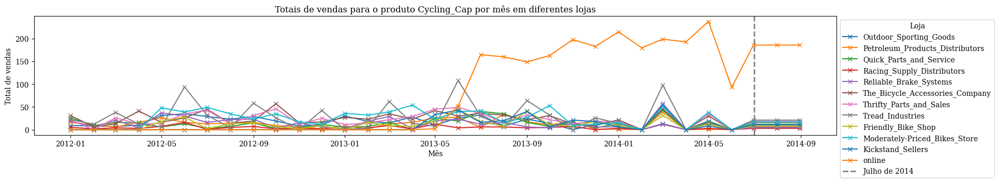

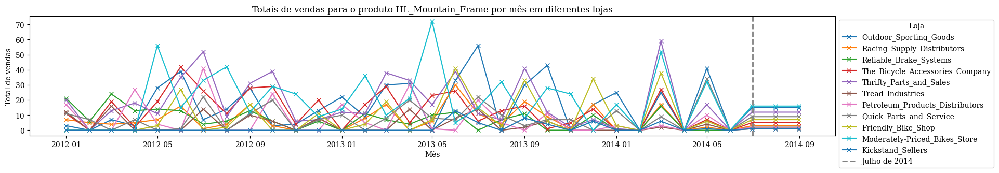

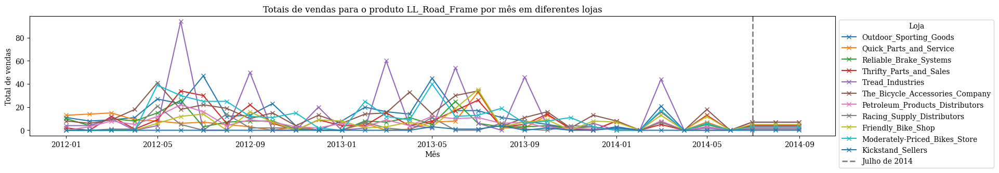

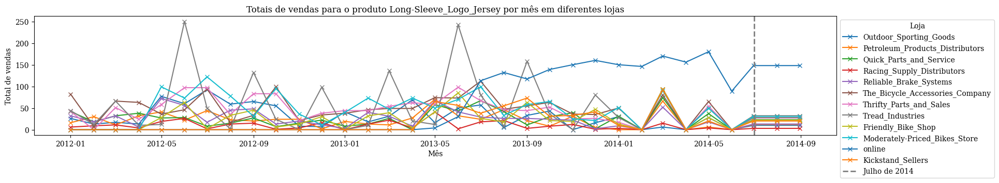

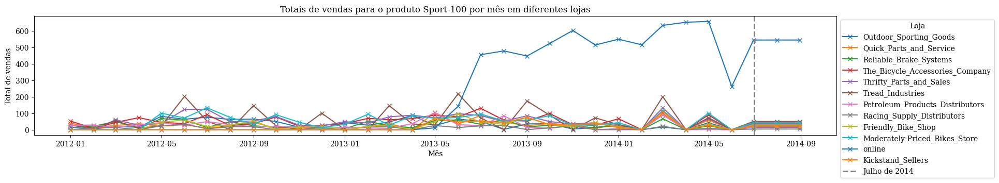

...

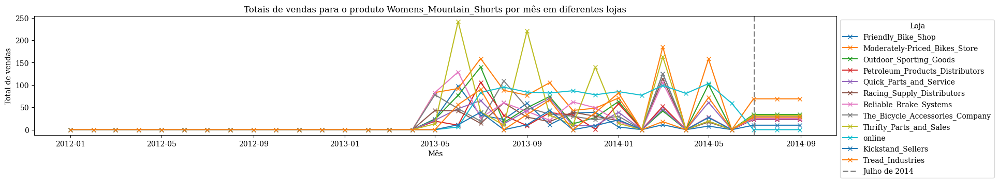

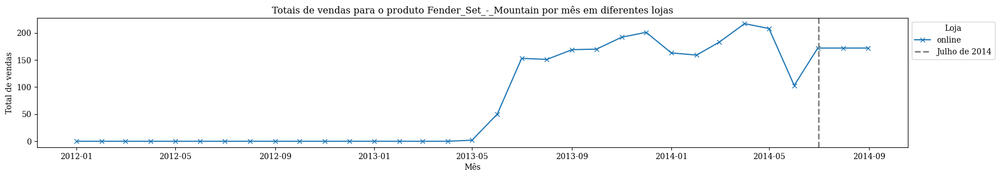

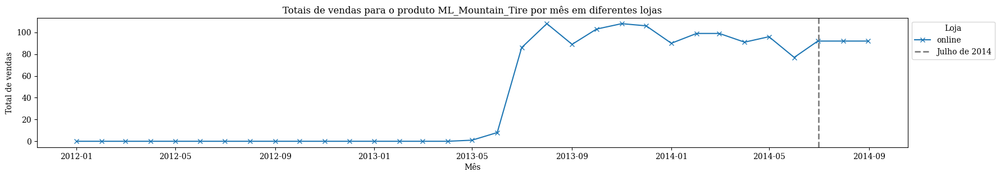

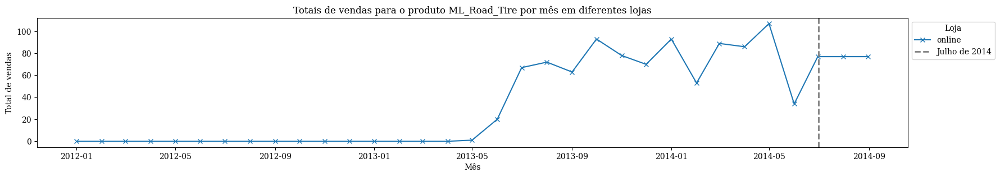

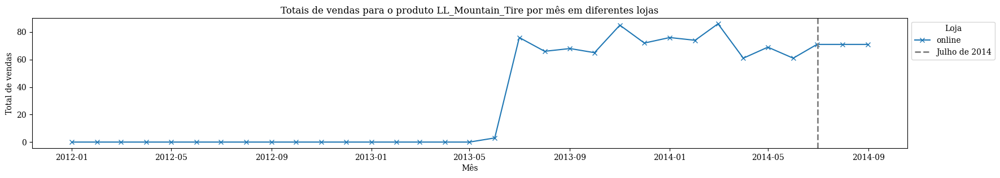

In [118]:
# Adiciona colunas adicionais para representar a região e a loja
df_product_predict[['Total', 'Região', 'Loja', 'Produto']] = df_product_predict['unique_id'].str.split('>', expand=True)

# Obtém a lista de todos os produtos únicos
produtos = df_product_predict['Produto'].unique()

# Para cada produto, cria um gráfico separado
for produto in produtos:
    # Filtra os dados para o produto atual
    df_produto = df_product_predict[df_product_predict['Produto'] == produto]
    
    # Configuração do tamanho dos gráficos
    plt.figure(figsize=(20, 3))
    
    # Para cada loja, cria um gráfico de linha
    for loja in df_produto['Loja'].unique():
        # Filtra os dados para a loja e produto atual
        df_loja_produto = df_produto[df_produto['Loja'] == loja]
        
        # Agrupa os dados por 'ds' (data) e soma as vendas
        df_grouped = df_loja_produto.groupby('ds')['y'].sum()
        
        # Cria o gráfico de linha
        plt.plot(df_grouped.index, df_grouped.values, label=loja, marker='x', linestyle='-')

    # Adiciona uma linha vertical pontilhada em julho de 2014
    plt.axvline(pd.to_datetime('2014-07'), color='gray', linestyle='--', linewidth=2, label='Julho de 2014')
    
    # Adiciona legendas e título ao gráfico
    plt.title(f'Totais de vendas para o produto {produto} por mês em diferentes lojas')
    plt.xlabel('Mês')
    plt.ylabel('Total de vendas')
    plt.legend(title='Loja', bbox_to_anchor=(1, 1))
    
    # Exibe o gráfico
    plt.show()

In [119]:
df_product_predict.tail(10)

,ds,unique_id,y,Total,Região,Loja,Produto
1484,2014-08-31,Total>others>online>Touring_Tire,82,Total,others,online,Touring_Tire
1485,2014-06-30,Total>others>online>Touring_Tire_Tube,128,Total,others,online,Touring_Tire_Tube
1486,2014-07-31,Total>others>online>Touring_Tire_Tube,128,Total,others,online,Touring_Tire_Tube
1487,2014-08-31,Total>others>online>Touring_Tire_Tube,128,Total,others,online,Touring_Tire_Tube
1488,2014-06-30,Total>others>online>Water_Bottle,355,Total,others,online,Water_Bottle
1489,2014-07-31,Total>others>online>Water_Bottle,355,Total,others,online,Water_Bottle
1490,2014-08-31,Total>others>online>Water_Bottle,355,Total,others,online,Water_Bottle
1491,2014-06-30,Total>others>online>Womens_Mountain_Shorts,0,Total,others,online,Womens_Mountain_Shorts
1492,2014-07-31,Total>others>online>Womens_Mountain_Shorts,0,Total,others,online,Womens_Mountain_Shorts
1493,2014-08-31,Total>others>online>Womens_Mountain_Shorts,0,Total,others,online,Womens_Mountain_Shorts


Investigando a produção de luvas

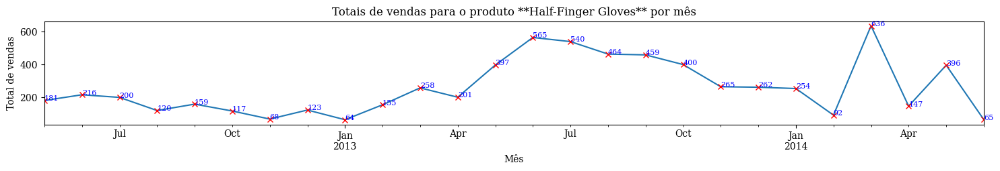

In [120]:
# Especifique o produto desejado
produto_desejado = 'Half-Finger Gloves' 

# Filtra os dados para o produto desejado
df_produto = df_aux[df_aux['productmodel_name'] == produto_desejado]

# Agrupa os dados por 'ano-mês' e soma as vendas
df_grouped = df_produto.groupby('ano_mes')['total_qtd_product'].sum()

# Configuração do tamanho do gráfico
plt.figure(figsize=(18, 2))

# Cria o gráfico de linha
df_grouped.plot(kind='line')

# Adiciona marcações com 'x' vermelho nos pontos de dados
df_grouped.plot(marker='x', linestyle='', color='red')

# Adiciona os valores para cada ponto
for x, y in zip(df_grouped.index, df_grouped.values):
    plt.text(x, y, str(y), color="blue", fontsize=8)

# Adiciona título e rótulos ao gráfico
plt.title(f'Totais de vendas para o produto **{produto_desejado}** por mês')
plt.xlabel('Mês')
plt.ylabel('Total de vendas')

# Exibe o gráfico
plt.show()

In [121]:
df_product_predict.head()

,ds,unique_id,y,Total,Região,Loja,Produto
0,2012-01-01,Total>US>Outdoor_Sporting_Goods>Cycling_Cap,9,Total,US,Outdoor_Sporting_Goods,Cycling_Cap
1,2012-01-01,Total>others>Petroleum_Products_Distributors>C...,16,Total,others,Petroleum_Products_Distributors,Cycling_Cap
2,2012-01-01,Total>others>Quick_Parts_and_Service>Cycling_Cap,26,Total,others,Quick_Parts_and_Service,Cycling_Cap
3,2012-01-01,Total>others>Racing_Supply_Distributors>Cyclin...,5,Total,others,Racing_Supply_Distributors,Cycling_Cap
4,2012-01-01,Total>US>Reliable_Brake_Systems>Cycling_Cap,19,Total,US,Reliable_Brake_Systems,Cycling_Cap


In [122]:
# Selecione os registros que contêm '>Half-Finger_Gloves' na coluna 'unique_id'
df_half_finger_gloves = df_product_predict[df_product_predict['unique_id'].str.contains('>Half-Finger_Gloves')]

# Exiba o DataFrame resultante
print(df_half_finger_gloves)

              ds                                          unique_id    y  \
44    2012-01-01     Total>US>Friendly_Bike_Shop>Half-Finger_Gloves    0   
45    2012-01-01  Total>US>Moderately-Priced_Bikes_Store>Half-Fi...    0   
46    2012-01-01  Total>US>Outdoor_Sporting_Goods>Half-Finger_Gl...    0   
47    2012-01-01  Total>others>Petroleum_Products_Distributors>H...    0   
48    2012-01-01  Total>others>Quick_Parts_and_Service>Half-Fing...    0   
49    2012-01-01  Total>others>Racing_Supply_Distributors>Half-F...    0   
50    2012-01-01  Total>US>Reliable_Brake_Systems>Half-Finger_Gl...    0   
51    2012-01-01  Total>US>The_Bicycle_Accessories_Company>Half-...    0   
52    2012-01-01  Total>US>Thrifty_Parts_and_Sales>Half-Finger_G...    0   
105   2012-01-01       Total>US>Tread_Industries>Half-Finger_Gloves    0   
205   2012-01-01      Total>US>Kickstand_Sellers>Half-Finger_Gloves    0   
400   2012-01-01             Total>others>online>Half-Finger_Gloves    0   
542   2012-0

In [123]:
# Converte a coluna 'ds' para o formato de data
df_half_finger_gloves['ds'] = pd.to_datetime(df_half_finger_gloves['ds'])

# Agrupa os dados por dia e soma as vendas
df_vendas_diarias = df_half_finger_gloves.groupby('ds')['y'].sum().reset_index()

# Exibe o DataFrame resultante
print(df_vendas_diarias)

           ds    y
0  2012-01-01    0
1  2012-02-01    0
2  2012-03-01    0
3  2012-04-01    0
4  2012-05-01  181
5  2012-06-01  216
6  2012-07-01  200
7  2012-08-01  120
8  2012-09-01  159
9  2012-10-01  117
10 2012-11-01   68
11 2012-12-01  123
12 2013-01-01   64
13 2013-02-01  155
14 2013-03-01  258
15 2013-04-01  201
16 2013-05-01  397
17 2013-06-01  565
18 2013-07-01  540
19 2013-08-01  464
20 2013-09-01  459
21 2013-10-01  400
22 2013-11-01  265
23 2013-12-01  262
24 2014-01-01  254
25 2014-02-01   92
26 2014-03-01  636
27 2014-04-01  147
28 2014-05-01  396
29 2014-06-01   65
30 2014-06-30  259
31 2014-07-31  259
32 2014-08-31  259


C:\Users\Raphael\AppData\Local\Temp\ipykernel_2244\2633274500.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_half_finger_gloves['ds'] = pd.to_datetime(df_half_finger_gloves['ds'])


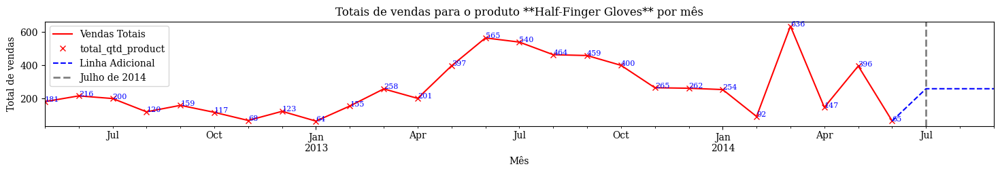

In [124]:
import matplotlib.pyplot as plt
import pandas as pd

# Supondo que você já tenha o DataFrame df_aux
# ... (código para carregar ou criar o DataFrame)

# Especifique o produto desejado
produto_desejado = 'Half-Finger Gloves'

# Filtra os dados para o produto desejado
df_produto = df_aux[df_aux['productmodel_name'] == produto_desejado]

# Agrupa os dados por 'ano-mês' e soma as vendas
df_grouped = df_produto.groupby('ano_mes')['total_qtd_product'].sum()

# Configuração do tamanho do gráfico
plt.figure(figsize=(18, 2))

# Cria o gráfico de linha principal
df_grouped.plot(kind='line', label='Vendas Totais', color='red')

# Adiciona marcações com 'x' vermelho nos pontos de dados
df_grouped.plot(marker='x', linestyle='', color='red')

# Adiciona os valores para cada ponto
for x, y in zip(df_grouped.index, df_grouped.values):
    plt.text(x, y, str(y), color="blue", fontsize=8)

# Adiciona linhas adicionais
df_adicional = pd.DataFrame({'ano_mes': ['2014-06-01','2014-07-01', '2014-08-31', '2014-09-01'],
                              'total_qtd_product': [65,259, 259, 259]})
df_adicional['ano_mes'] = pd.to_datetime(df_adicional['ano_mes'])
df_adicional_grouped = df_adicional.groupby('ano_mes')['total_qtd_product'].sum()
df_adicional_grouped.plot(kind='line', label='Linha Adicional', linestyle='--', color='blue')

# Adiciona uma linha pontilhada vertical em julho de 2014
plt.axvline(pd.to_datetime('2014-07'), color='gray', linestyle='--', linewidth=2, label='Julho de 2014')

# Adiciona título e rótulos ao gráfico
plt.title(f'Totais de vendas para o produto **{produto_desejado}** por mês')
plt.xlabel('Mês')
plt.ylabel('Total de vendas')

# Adiciona a legenda
plt.legend()

# Exibe o gráfico
plt.show()


### Um novo fornecedor de luvas, que agora engloba toda a produção mundial, precisa ter uma estimativa de quantos zíperes precisa pedir para os próximos 3 meses. Levando em consideração que são necessários 2 zíperes por par, quantos seriam necessários?
o modelo prevê a venda mensal de aproximadamente 259 pares de luvas. Como há uma tendência de queda no trimestre, aproximadamente 750 zíperes


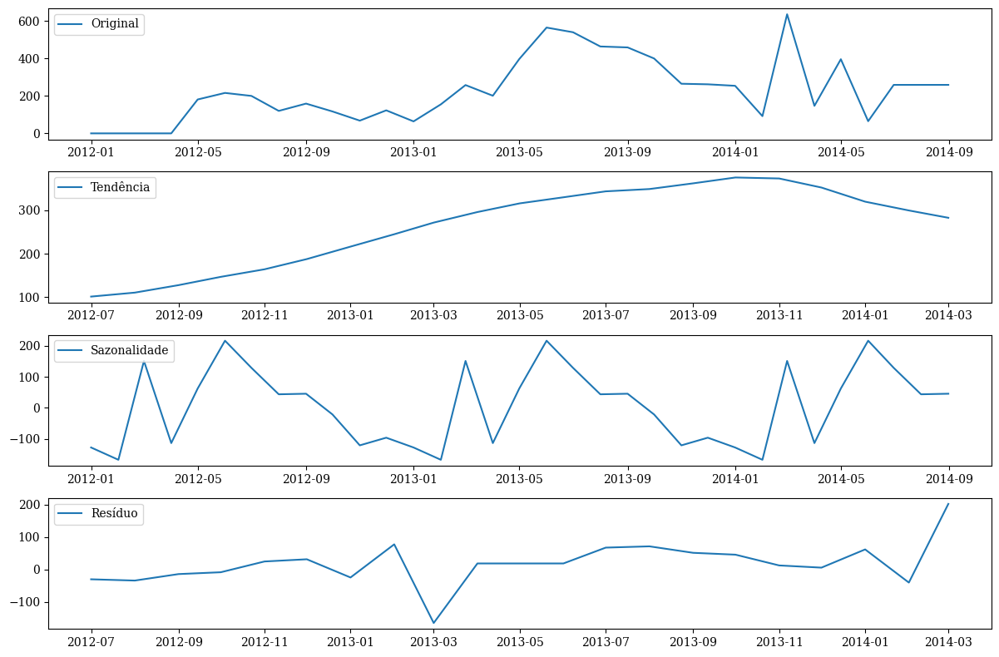

In [125]:
# Converte a coluna 'ds' para o formato de data
df_vendas_diarias['ds'] = pd.to_datetime(df_vendas_diarias['ds'])

# Define a coluna 'ds' como índice para a decomposição
df_vendas_diarias.set_index('ds', inplace=True)

# Realiza a decomposição aditiva
result = seasonal_decompose(df_vendas_diarias['y'], model='aditive', period=12)  # O período sazonal pode variar

# Plota a decomposição
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(df_vendas_diarias['y'], label='Original')
plt.legend(loc='upper left')

plt.subplot(4, 1, 2)
plt.plot(result.trend, label='Tendência')
plt.legend(loc='upper left')

plt.subplot(4, 1, 3)
plt.plot(result.seasonal, label='Sazonalidade')
plt.legend(loc='upper left')

plt.subplot(4, 1, 4)
plt.plot(result.resid, label='Resíduo')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()


In [126]:
from statsmodels.tsa.stattools import kpss

# Realiza o teste KPSS
stat, p_value, lags, crit_values = kpss(df_vendas_diarias['y'])

# Exibe os resultados
print(f'Estatística do teste KPSS: {stat}')
print(f'Valor p: {p_value}')
print(f'Lags utilizados: {lags}')
print(f'Valores críticos: {crit_values}')

# Testa a hipótese nula
alpha = 0.05
if p_value < alpha:
    print('Rejeita a hipótese nula: Há evidências de não-estacionariedade (presença de sazonalidade).')
else:
    print('Não há evidências suficientes para rejeitar a hipótese nula: Estacionariedade (ausência de sazonalidade).')

Estatística do teste KPSS: 0.4441548401103768
Valor p: 0.05812291374552724
Lags utilizados: 3
Valores críticos: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Não há evidências suficientes para rejeitar a hipótese nula: Estacionariedade (ausência de sazonalidade).


## Como a estatística do teste é menor que os valores críticos em todos os níveis de significância, não há evidências suficientes para rejeitar a hipótese nula. Portanto, não há evidências para afirmar que há sazonalidade significativa na venda de luvas.

9. Os novos centros de distribuição passaram a ser divididos em províncias nos EUA e em países no resto do mundo. Qual desses grupos apresentou mais crescimento em demanda nos três meses previstos

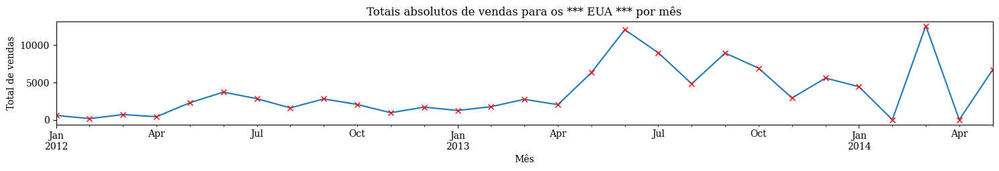

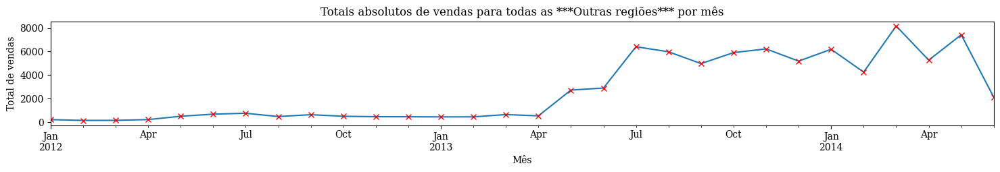

In [127]:
# Filtra os dados para a região dos EUA
df_online = df_aux[df_aux['countryregioncode'] == 'US']

# Filtra os dados para resto do mundo
df_outros = df_aux[df_aux['countryregioncode'] != 'US']

# Agrupa os dados por 'ano-mês' e soma as vendas
df_total_online = df_online.groupby('ano_mes')['total_qtd_product'].sum()
df_total_outros = df_outros.groupby('ano_mes')['total_qtd_product'].sum()

# Cria o gráfico para a loja 'online'
df_total_online.plot(kind='line', figsize=(18,2))
df_total_online.plot(marker='x', linestyle='', color='red')
plt.title('Totais absolutos de vendas para os *** EUA *** por mês')
plt.xlabel('Mês')
plt.ylabel('Total de vendas')
plt.show()

# Cria o gráfico para todas as outras lojas
df_total_outros.plot(kind='line', figsize=(18,2))
df_total_outros.plot(marker='x', linestyle='', color='red')
plt.title('Totais absolutos de vendas para todas as ***Outras regiões*** por mês')
plt.xlabel('Mês')
plt.ylabel('Total de vendas')
plt.show()

In [128]:
# Criando uma lista de identificadores que estão no nível do produto.
# Um identificador está no nível do produto se contém exatamente três '>' em sua string.
df_us = dfx[dfx['unique_id'].str.count('>') == 1]
df_us

,ds,unique_id,y
0,2012-01-01,Total>US,578
1,2012-01-01,Total>others,225
2,2012-02-01,Total>US,153
3,2012-02-01,Total>others,157
4,2012-03-01,Total>US,693
5,2012-03-01,Total>others,162
6,2012-04-01,Total>US,402
7,2012-04-01,Total>others,228
8,2012-05-01,Total>US,2277
9,2012-05-01,Total>others,510


In [129]:
# Converte a coluna 'ds' para o formato de data
df_us['ds'] = pd.to_datetime(df_us['ds'])

# Agrupa os dados por dia e soma as vendas
df_vendas_diarias_regiao = df_us.groupby(['ds','unique_id'])['y'].sum().reset_index()

# Exibe o DataFrame resultante
print(df_vendas_diarias_regiao)

           ds     unique_id      y
0  2012-01-01      Total>US    578
1  2012-01-01  Total>others    225
2  2012-02-01      Total>US    153
3  2012-02-01  Total>others    157
4  2012-03-01      Total>US    693
5  2012-03-01  Total>others    162
6  2012-04-01      Total>US    402
7  2012-04-01  Total>others    228
8  2012-05-01      Total>US   2277
9  2012-05-01  Total>others    510
10 2012-06-01      Total>US   3693
11 2012-06-01  Total>others    687
12 2012-07-01      Total>US   2818
13 2012-07-01  Total>others    766
14 2012-08-01      Total>US   1586
15 2012-08-01  Total>others    486
16 2012-09-01      Total>US   2785
17 2012-09-01  Total>others    642
18 2012-10-01      Total>US   2045
19 2012-10-01  Total>others    509
20 2012-11-01      Total>US    937
21 2012-11-01  Total>others    472
22 2012-12-01      Total>US   1687
23 2012-12-01  Total>others    466
24 2013-01-01      Total>US   1239
25 2013-01-01  Total>others    456
26 2013-02-01      Total>US   1744
27 2013-02-01  Total

C:\Users\Raphael\AppData\Local\Temp\ipykernel_2244\1258063754.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_us['ds'] = pd.to_datetime(df_us['ds'])


Para o nível de região, o modelo que melhor performou foi `WindowAverage/MinTrace_method-ols` mais uma vez as médias móveis
* Total>Region rmse: 2885.8211 ->(rec) 2885.821

# Continuar

In [130]:
products_hat_rec.head()

,ds,AutoARIMA,WindowAverage,Naive,AutoARIMA/BottomUp,WindowAverage/BottomUp,Naive/BottomUp,AutoARIMA/TopDown_method-forecast_proportions,WindowAverage/TopDown_method-forecast_proportions,Naive/TopDown_method-forecast_proportions,AutoARIMA/MinTrace_method-ols,WindowAverage/MinTrace_method-ols,Naive/MinTrace_method-ols
unique_id,,,,,,,,,,,,,
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-06-30,9.687787,9.833333,0.0,9.687787,9.833333,0.0,0.0,0.0,0.0,9.687787,9.833333,0.0
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-07-31,9.687787,9.833333,0.0,9.687787,9.833333,0.0,0.0,0.0,0.0,9.687787,9.833333,0.0
Total>US>Friendly_Bike_Shop>Bike_Wash,2014-08-31,9.687787,9.833333,0.0,9.687787,9.833333,0.0,0.0,0.0,0.0,9.687787,9.833333,0.0
Total>US>Friendly_Bike_Shop>Chain,2014-06-30,5.009829,4.833333,0.0,5.009829,4.833333,0.0,0.0,0.0,0.0,5.009829,4.833333,0.0
Total>US>Friendly_Bike_Shop>Chain,2014-07-31,5.009829,4.833333,0.0,5.009829,4.833333,0.0,0.0,0.0,0.0,5.009829,4.833333,0.0


In [131]:
df_region_level_hat = fcst.forecast(df = df_vendas_diarias_regiao,h=3)

C:\ProgramData\Anaconda3\lib\site-packages\statsforecast\core.py:417: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


In [132]:
df_region_level_hat

,ds,AutoARIMA,WindowAverage,Naive
unique_id,,,,
Total>US,2014-06-30,4410.560059,3946.666748,0.0
Total>US,2014-07-31,1504.952881,3946.666748,0.0
Total>US,2014-08-31,3419.121094,3946.666748,0.0
Total>others,2014-06-30,5392.349121,5572.833496,2119.0
Total>others,2014-07-31,1728.274902,5572.833496,2119.0
Total>others,2014-08-31,4727.397949,5572.833496,2119.0


In [133]:
missing_indices = S.index.difference(df_region_level_hat.index)
print(missing_indices)

CategoricalIndex(['Total', 'Total>US>Friendly_Bike_Shop',
                  'Total>US>Friendly_Bike_Shop>Bike_Wash',
                  'Total>US>Friendly_Bike_Shop>Chain',
                  'Total>US>Friendly_Bike_Shop>Classic_Vest',
                  'Total>US>Friendly_Bike_Shop>Cycling_Cap',
                  'Total>US>Friendly_Bike_Shop>Front_Brakes',
                  'Total>US>Friendly_Bike_Shop>Front_Derailleur',
                  'Total>US>Friendly_Bike_Shop>HL_Bottom_Bracket',
                  'Total>US>Friendly_Bike_Shop>HL_Crankset',
                  ...
                  'Total>others>online>Road_Tire_Tube',
                  'Total>others>online>Short-Sleeve_Classic_Jersey',
                  'Total>others>online>Sport-100',
                  'Total>others>online>Touring-1000',
                  'Total>others>online>Touring-2000',
                  'Total>others>online>Touring-3000',
                  'Total>others>online>Touring_Tire',
                  'Total>others>onl

In [134]:
S_df = S[S.index.isin(df_region_level_hat.index)]

In [135]:
# Reconcile the base predictions
reconcilers = [
    BottomUp(), #1
    TopDown(method='forecast_proportions'), #2
    MinTrace(method='ols')
]

hrec_region = HierarchicalReconciliation(reconcilers=reconcilers)

regions_hat_rec = hrec_region.reconcile(Y_hat_df=df_region_level_hat, S=S_df,tags=tags)
###reconcile(products_hat, S, tags)
regions_hat_rec.head(12)

,ds,AutoARIMA,WindowAverage,Naive,AutoARIMA/BottomUp,WindowAverage/BottomUp,Naive/BottomUp,AutoARIMA/TopDown_method-forecast_proportions,WindowAverage/TopDown_method-forecast_proportions,Naive/TopDown_method-forecast_proportions,AutoARIMA/MinTrace_method-ols,WindowAverage/MinTrace_method-ols,Naive/MinTrace_method-ols
unique_id,,,,,,,,,,,,,
Total>US,2014-06-30,4410.560059,3946.666748,0.0,0.0000,0.0,0.0,4410.560059,3946.666748,0.0,4424.917526,3959.514127,0.000000
Total>US,2014-07-31,1504.952881,3946.666748,0.0,0.0000,0.0,0.0,1504.952881,3946.666748,0.0,1509.851876,3959.514127,0.000000
Total>US,2014-08-31,3419.121094,3946.666748,0.0,0.0000,0.0,0.0,3419.121094,3946.666748,0.0,3430.251181,3959.514127,0.000000
Total>others,2014-06-30,5392.349121,5572.833496,2119.0,873561.8750,902798.0,343278.0,0.000000,0.000000,0.0,5419.484080,5600.876675,2129.663067
Total>others,2014-07-31,1728.274902,5572.833496,2119.0,279981.0000,902798.0,343278.0,0.000000,0.000000,0.0,1736.971793,5600.876675,2129.663067
Total>others,2014-08-31,4727.397949,5572.833496,2119.0,765837.5625,902798.0,343278.0,0.000000,0.000000,0.0,4751.186793,5600.876675,2129.663067


In [136]:
regions_hat_rec[['ds', 'WindowAverage/MinTrace_method-ols']].round(0)

,ds,WindowAverage/MinTrace_method-ols
unique_id,,
Total>US,2014-06-30,3960.0
Total>US,2014-07-31,3960.0
Total>US,2014-08-31,3960.0
Total>others,2014-06-30,5601.0
Total>others,2014-07-31,5601.0
Total>others,2014-08-31,5601.0


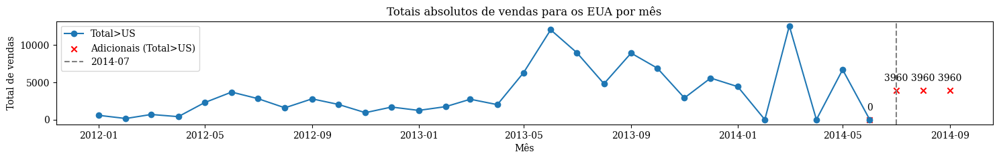

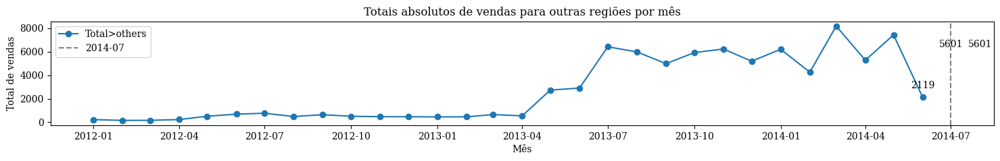

In [137]:
# Seu DataFrame original
data = {
    'unique_id': ['Total>US', 'Total>US', 'Total>US', 'Total>US', 'Total>others', 'Total>others', 'Total>others', 'Total>others'],
    'ds': ['2014-06-01', '2014-07-01', '2014-08-01', '2014-09-01', '2014-06-01', '2014-07-01', '2014-08-01', '2014-09-01'],
    'y': [0, 3960, 3960, 3960, 2119, 5601, 5601, 5601]
}

df_adicionais = pd.DataFrame(data)
df_adicionais['ds'] = pd.to_datetime(df_adicionais['ds'])

# Filtrar dados para Total>US
df_us = df_vendas_diarias_regiao[df_vendas_diarias_regiao['unique_id'] == 'Total>US']

# Filtrar dados para Total>others
df_others = df_vendas_diarias_regiao[df_vendas_diarias_regiao['unique_id'] == 'Total>others']

# Configurar o tamanho do gráfico
plt.figure(figsize=(18, 2))

# Gráfico para Total>US
plt.plot(df_us['ds'], df_us['y'], label='Total>US', marker='o', linestyle='-')

# Adicionar valores adicionais para Total>US
plt.scatter(df_adicionais[df_adicionais['unique_id'] == 'Total>US']['ds'],
            df_adicionais[df_adicionais['unique_id'] == 'Total>US']['y'],
            color='red', label='Adicionais (Total>US)', marker='x')

# Adicionar linha pontilhada vertical em 2014-07
plt.axvline(pd.to_datetime('2014-07-01'), color='gray', linestyle='--', label='2014-07')

# Adicionar valores ao gráfico
for i, txt in enumerate(df_adicionais[df_adicionais['unique_id'] == 'Total>US']['y']):
    plt.annotate(txt, (df_adicionais[df_adicionais['unique_id'] == 'Total>US']['ds'].iloc[i], txt), textcoords="offset points", xytext=(0, 10), ha='center')

# Conectar as linhas para os meses 07, 08 e 09 à série anterior
plt.plot(df_us[df_us['ds'].isin(pd.to_datetime(['2014-07-01', '2014-08-01', '2014-09-01']))]['ds'],
         df_us[df_us['ds'].isin(pd.to_datetime(['2014-07-01', '2014-08-01', '2014-09-01']))]['y'],
         marker='o', linestyle='-', color='black')

# Configurar título e rótulos
plt.title('Totais absolutos de vendas para os EUA por mês')
plt.xlabel('Mês')
plt.ylabel('Total de vendas')

# Adicionar legenda
plt.legend()

# Exibir o gráfico
plt.show()

# Configurar o tamanho do gráfico para todas as outras lojas
plt.figure(figsize=(18, 2))

# Gráfico para todas as outras lojas
plt.plot(df_others['ds'], df_others['y'], label='Total>others', marker='o', linestyle='-')

# Adicionar valores ao gráfico
for i, txt in enumerate(df_adicionais[df_adicionais['unique_id'] == 'Total>others']['y']):
    plt.annotate(txt, (df_adicionais[df_adicionais['unique_id'] == 'Total>others']['ds'].iloc[i], txt), textcoords="offset points", xytext=(0, 10), ha='center')

# Adicionar linha pontilhada vertical em 2014-07
plt.axvline(pd.to_datetime('2014-07-01'), color='gray', linestyle='--', label='2014-07')

# Conectar as linhas para os meses 07, 08 e 09 à série anterior
plt.plot(df_others[df_others['ds'].isin(pd.to_datetime(['2014-07-01', '2014-08-01', '2014-09-01']))]['ds'],
         df_others[df_others['ds'].isin(pd.to_datetime(['2014-07-01', '2014-08-01', '2014-09-01']))]['y'],
         marker='o', linestyle='-', color='red')

# Configurar título e rótulos
plt.title('Totais absolutos de vendas para outras regiões por mês')
plt.xlabel('Mês')
plt.ylabel('Total de vendas')

# Adicionar legenda
plt.legend()

# Exibir o gráfico
plt.show()

# Seria possível resolver este problema através de uma abordagem utilizando modelos de regressão? Se sim, qual demonstra melhor resultado? Justifique utilizando métricas de avaliação.

In [138]:
from sklearn.preprocessing import StandardScaler

# Seleção das colunas relevantes
columns_of_interest = ['orderdate', 'total_qtd_product', 'unitprice_product', 'productmodel_name', 'name_store', 'countryregioncode']
df_lin = df[columns_of_interest].copy()

# Adicionando colunas de mês e ano
df_lin['month'] = pd.to_datetime(df_lin['orderdate']).dt.month
df_lin['year'] = pd.to_datetime(df_lin['orderdate']).dt.year

# Convertendo a coluna 'orderdate' para timestamp Unix
df_lin['orderdate'] = pd.to_datetime(df_lin['orderdate']).astype('int64') // 10**9

# Definindo as variáveis independentes e dependentes
X_lin = df_lin.drop(columns=['total_qtd_product'])
y_lin = df_lin['total_qtd_product']

# Criando uma lista das colunas categóricas
categorical = X_lin.dtypes == object

# Criando o transformador de colunas com OneHotEncoder para colunas categóricas
preprocess = make_column_transformer(
    (StandardScaler(), ~categorical),
    (OneHotEncoder(), categorical),
)

# Dividindo os dados em conjuntos de treinamento e teste
X_train_lin, X_test_lin, y_train_lin, y_test_lin = train_test_split(X_lin, y_lin, test_size=0.3, random_state=42)

# Criando um pipeline que primeiro transforma os dados e depois ajusta um modelo de regressão linear
model = make_pipeline(
    preprocess,
    LinearRegression()
)

# Ajustando o modelo aos dados de treinamento
model.fit(X_train_lin, y_train_lin)

# Fazendo previsões nos dados de teste
y_pred_lin = model.predict(X_test_lin)

# Calculando o erro quadrático médio das previsões
mean_squared_error = mse(y_test_lin, y_pred_lin)

print(f'Mean Squared Error: {mean_squared_error}')


Mean Squared Error: 154.01707742404537


In [139]:

print('LinearRegressor overall rmse:',np.sqrt(mean_squared_error).round(4))

LinearRegressor overall rmse: 12.4104


LinearRegressor overall rmse: 12.4104

AutoARIMA  overall rmse: 429.718 ->(rec) 276.1946
AutoARIMA  overall rmse: 429.718 ->(rec) 466.4917
AutoARIMA  overall rmse: 429.718 ->(rec) 425.5949

WindowAverage  overall rmse: 287.7195 ->(rec) 287.8966
WindowAverage  overall rmse: 287.7195 ->(rec) 287.7313
WindowAverage  overall rmse: 287.7195 ->(rec) 287.748

Naive  overall rmse: 708.7267 ->(rec) 708.9591
Naive  overall rmse: 708.7267 ->(rec) 708.7375
Naive  overall rmse: 708.7267 ->(rec) 708.7383


## O modelo de regressão linear consegue prever com um RMSE bem menor! É sim possível, mas deve ser usado com cautela pois não foi concebido para forecast e ao extrapolar seu intervalo de terino/teste , em especial para modelos temporais, ele perderá a componente temporal de sazonalidade.

In [140]:
%whos

Variable                     Type                          Data/Info
--------------------------------------------------------------------
AutoARIMA                    type                          <class 'statsforecast.models.AutoARIMA'>
BottomUp                     type                          <class 'hierarchicalforecast.methods.BottomUp'>
ConformalIntervals           type                          <class 'statsforecast.utils.ConformalIntervals'>
ERM                          type                          <class 'hierarchicalforecast.methods.ERM'>
HierarchicalData             type                          <class 'datasetsforecast.<...>chical.HierarchicalData'>
HierarchicalEvaluation       type                          <class 'hierarchicalforec<...>.HierarchicalEvaluation'>
HierarchicalReconciliation   type                          <class 'hierarchicalforec<...>rarchicalReconciliation'>
LinearRegression             ABCMeta                       <class 'sklearn.linear_mo<...>._base.Line

In [144]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.
